In Raven_night_k_retrieval.ipynb the SLEIGH skin temperature goes above 0 much more that expected/is reasonable. This notebook is meant to follow corrections from Chris Cox in an email on October 17, 2024.

1) Were the IR20 ventilators always turned on?
If yes, then do nothing for this step. However, if the ventilators were off and the case heaters were turned on, then both LWU and LWD are biased high by 1.28 Wm2 (based on cold chamber tests).

2) Remove the influence of the air between the sensor and surface.
See attached figure, LWUbias.png. LWUcorr = (LWU - correction) where the correction equation is in the legend. This is based on SPLASH data but it should be reasonable for Raven. Sounds like a good approximation for Raven is the 2 m height (red line). If we think it is useful at Raven but want to do better we could refine it later. 

x = T2m-Tsfc where Tsfc is the uncorrected estimate based on the radiometers: Obviously, this means x is biased as well in a way that underestimates the magnitude of the correction, potentially by a lot. You could try implementing the correction iteratively to converge on a more realistic value; i.e., recalculate x after applying the initial correction maybe 1-2 iterations. I haven't tried that before. 

Go ahead and apply it for all conditions though I haven't put much thought or testing into cases where the correction is negative but I would expect these would be very small adjustments and applying it for all times makes for a smoother application without discontinuities. For melting cases at Raven I expect it will reduce the calculated Tsfc by maximum ~1.1 C and more typically 0.25-0.5 C. If x is poorly constrained it might underestimate the correction. If the actual gradient is small when we have a bias, then this is just not an important contributing factor to errors in Tsfc.

Note that you could also apply the correction * -1 to LWD to transfer that measurement to the surface. 

3) Attempt to remove solar heating from LWU
If at this point, there is still a bias, it might be related to solar heating of the unshaded some.
a) Identify a subset of times when you think the surface is 0 C; e.g., T2m >= 0. 
b) Plot SZA vs Tsfc-273.15 (could also do units of Wm2) for that subset. You will probably find that when the sun is low in the sky Tsfc is unbiased and that the bias becomes positive as the sun gets higher in the sky. If the bias is uncorrelated with SZA, then solar heating is probably not the problem. If it is, you can make a linear correction as a function of SZA (the actual relationship is probably not quite linear). I think it is ok to apply this at all temperatures, but the error will be somehow dependent on sky conditions, probably largest when the sky is clear and smallest when it's cloudy. I suggest making SZA v Tsfc-273 scatter plots color-coded by diffuse fraction from the SPN1 (DIF / TOTAL), LWD, and SWD. I'm not sure which of these variables will be most effective in resolving the magnitude of the error at constant SZA. With whichever variable is most effective you could use it to either set (i) a threshold on when the correction should be applied (e.g., see attached figure from Barrow for diffuse fraction showing that for SZA < ~85 deg, differentiating when the direct beam is unobstructed is straight-forward) or (ii) create a correction using multiple linear regression with SZA and diffuse fraction (or LWD or SWD) as two independent variables and apply the correction to all times. If the Raven data does not have enough samples for the subset to do this, we could probably use data from the same sensor at other experiments to estimate it. 

In [1]:
import matplotlib.pyplot as plt
import datetime, time, math, cmocean, csv
import numpy as np
import netCDF4 as nc
from scipy import interpolate, stats
# from scipy import interpolate
import glob

import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%m-%d')

In [2]:
def calc_skin_temp(lwd,lwu,emis):
    """ From Cox et al 2023: 'For snow, ε was set to 0.985, consistent with other studies (e.g., ref. 13) and justified by 
    the relatively spectrally flat hemispheric infrared emissivity of snow. For the wintertime snow surface, this assumption 
    is likely within 0.5% (~ 0.04 C at MOSAiC), but during summer when the surface type was variably ice, liquid, or melting 
    snow, the actual emissivity may have differed by more.' """
    sigma = 5.670374419*(10.**-8)
    Ts = ( (lwu - (1.-emis)*lwd)/(emis*sigma))**0.25
    return Ts

In [3]:
def load_netcdf(filepath, in_vars):
    """ open netcdf file, load variables (in_vars should be a list) and
        output dictionary of variables"""
    from netCDF4 import Dataset

    out_vars = {}

    open_netcdf = Dataset(filepath, mode = 'r')
    if len(in_vars)>0:
        for var in in_vars:
            out_vars[var] = open_netcdf.variables[var][:]
    else:
        for var in open_netcdf.variables.keys():
            out_vars[var] = open_netcdf.variables[var][:]

    try:
        out_vars['time_unit'] = open_netcdf.variables['time'].units
    except:
        None
    open_netcdf.close()
    #print(out_vars.keys())
    return out_vars

In [4]:
def LWU_air_correction(LWU, T2M, TSFC):
    # based on SPLASH data, see LWUbias.png for 2m
    x = T2M - TSFC
    LWU_BIAS = 0.2899*x-0.03497
    LWU_CORR = LWU - LWU_BIAS
    return LWU_CORR, LWU_BIAS

In [5]:
# asfs_filepath_summ = '/psd3data/arctic/raven_process/asfs/level1/'
# asfs_summ_files = glob.glob(asfs_filepath_summ+'*slow*.nc')
# asfs_summ_files.sort()
# # asfs_summ_files = asfs_summ_files[8:]

In [6]:
# turn into function later
asfs_filepath = '/psd3data/arctic/raven_process/asfs/level1/'
asfs_lev1_files = glob.glob(asfs_filepath+'slow.level1.melt-sleighsfs.*.nc')
asfs_lev1_files.sort()
asfs_lev1_files = asfs_lev1_files[12:] # early files don't have skin_temp_surface?

# vaisala_T_Avg = average of the air temperature during the 1 min averaging interval

lev1_slow_vars = ['ir20_lwd_Wm2_Avg','ir20_lwu_Wm2_Avg','vaisala_T_Avg', 'apogee_targ_T_Avg', 'apogee_body_T_Avg',
                  'sr30_swu_IrrC_Avg', 'sr30_swd_IrrC_Avg', 'ir20_lwu_DegC_Avg',#'skin_temp_surface',
                  'zenith_true','azimuth','spn1_tot_Avg','spn1_dif_Avg',
                  'base_time','time']

asfs_data_lev1 = {}

for fname in asfs_lev1_files[:]:
    print(fname)

    fdic = load_netcdf(fname, lev1_slow_vars)

    fstart_time = datetime.datetime.strptime(fdic['time_unit'], 'seconds since %Y-%m-%dT%H:%M:%S.000000')
    fdic['dates'] = np.asarray([fstart_time+datetime.timedelta(seconds=int(m)) for m in fdic['time']])

    for var in lev1_slow_vars[:-2]+['dates']:
        if var not in asfs_data_lev1:
            asfs_data_lev1[var] = fdic[var]
        else:
            asfs_data_lev1[var] = np.ma.concatenate( (asfs_data_lev1[var], fdic[var]), axis=0 )
            

/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240528.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240529.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240530.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240531.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240601.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240602.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240603.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240604.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240605.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240606.000000.nc
/psd3data/arctic/raven_process/asfs/level1/slow.level1.melt-sleighsfs.20240607.000000.nc
/psd3data/arctic/rave

In [7]:
asfs_data_lev1['skin_temp_surface'] = calc_skin_temp(asfs_data_lev1['ir20_lwd_Wm2_Avg'],asfs_data_lev1['ir20_lwu_Wm2_Avg'],0.985) - 273.15

In [8]:
asfs_data_lev1['sr30_swd_IrrC_Avg'] = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'], 0,2000)
asfs_data_lev1['sr30_swu_IrrC_Avg'] = np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'], 0,2000)

In [9]:
## mask some suspect values in temperatures

asfs_data_lev1['skin_temp_surface'] = np.ma.masked_greater(asfs_data_lev1['skin_temp_surface'], 10)
asfs_data_lev1['ir20_lwu_Wm2_Avg'] = np.ma.masked_outside(asfs_data_lev1['ir20_lwu_Wm2_Avg'], -10,350)

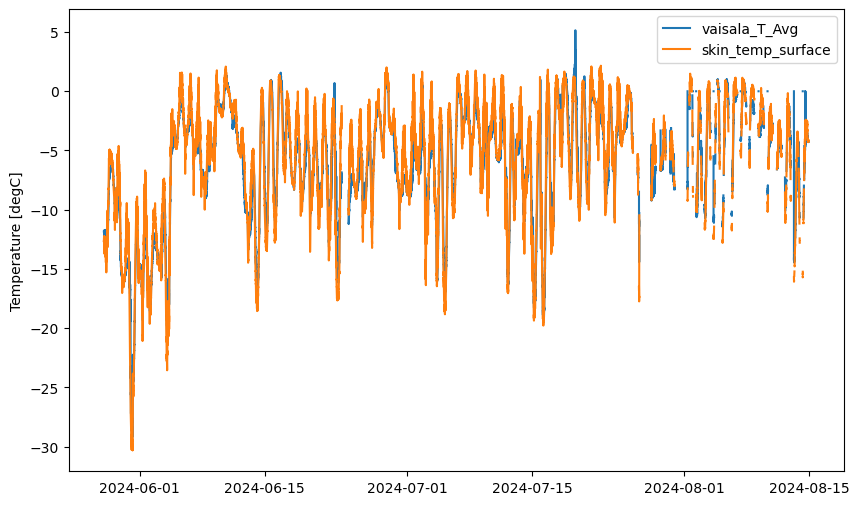

In [10]:
fig, ax = plt.subplots(1, figsize=(10,6))
for var in ['vaisala_T_Avg','skin_temp_surface']:
    pltvar = asfs_data_lev1[var]
    plt.plot(asfs_data_lev1['dates'], pltvar, label=var)
plt.legend(loc='best')
plt.ylabel('Temperature [degC]')
# plt.xlim(datetime.datetime(2024,5,15), datetime.datetime(2024,5,25))
plt.show()

In [10]:
# first apply air correction (step 2)
lwu_air_corr, lwu_air_bias = LWU_air_correction(asfs_data_lev1['ir20_lwu_Wm2_Avg'], asfs_data_lev1['vaisala_T_Avg'], asfs_data_lev1['skin_temp_surface'])

In [11]:
asfs_data_lev1['deltaT'] = asfs_data_lev1['vaisala_T_Avg'] - asfs_data_lev1['skin_temp_surface']
asfs_data_lev1['lwu_air_corr'] = lwu_air_corr
asfs_data_lev1['lwu_air_bias'] = lwu_air_bias

In [12]:
labels = {'deltaT':{'ylabel':'T2m - Tsfc', 'legend':''}, 'ir20_lwu_Wm2_Avg':{'ylabel':'LWU [W m-2]', 'legend':'raw'},
         'lwu_air_corr':{'ylabel':'LWU [W m-2]', 'legend':'air correction'}}

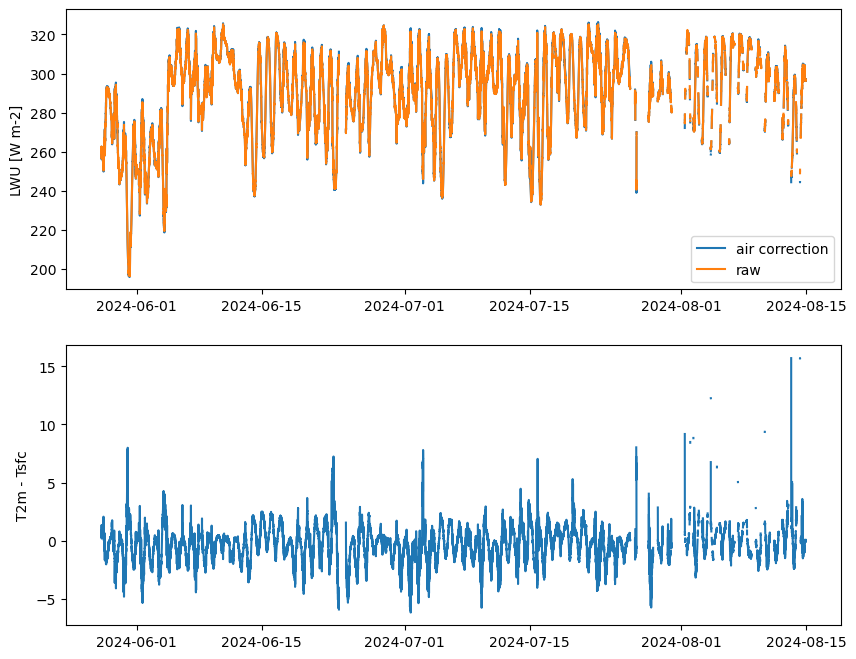

In [14]:
fig, axs = plt.subplots(2, figsize=(10,8))


for ax, varname in zip(axs.ravel(), ['lwu_air_corr', 'deltaT']):
    ax.plot(asfs_data_lev1['dates'], asfs_data_lev1[varname], label=labels[varname]['legend'])
    ax.set_ylabel(labels[varname]['ylabel'])

axs[0].plot(asfs_data_lev1['dates'], asfs_data_lev1['ir20_lwu_Wm2_Avg'], label=labels['ir20_lwu_Wm2_Avg']['legend'])
axs[0].legend(loc='best')
plt.show()

In [13]:
## recalculate skin temperature to see if it's any better
Ts_air_corr = calc_skin_temp(asfs_data_lev1['ir20_lwd_Wm2_Avg'],asfs_data_lev1['lwu_air_corr'],0.985)
asfs_data_lev1['Ts_air_corr'] = Ts_air_corr - 273.15

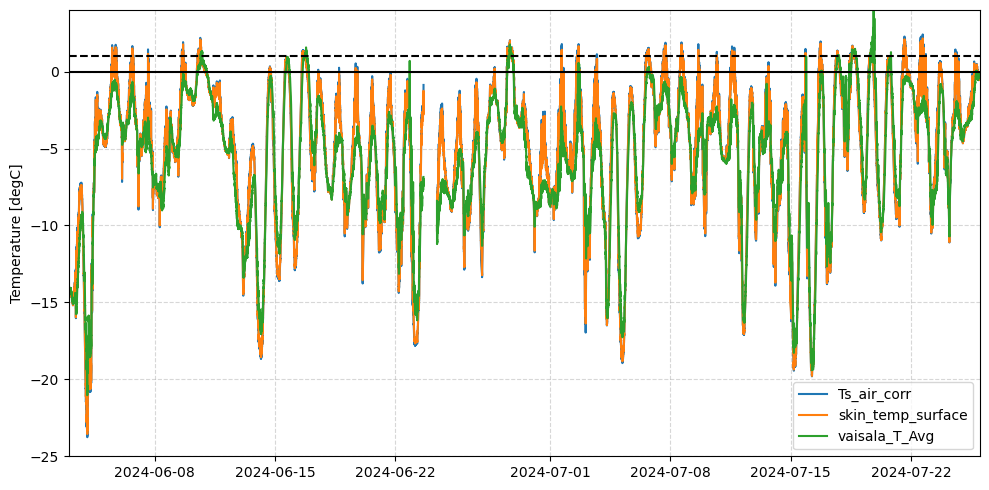

In [13]:
fig, ax = plt.subplots(1, figsize=(10,5))

for varname in ['Ts_air_corr', 'skin_temp_surface','vaisala_T_Avg']:
    plt.plot(asfs_data_lev1['dates'], asfs_data_lev1[varname], label=varname)

plt.xlim(datetime.datetime(2024,6,3),datetime.datetime(2024,7,26))
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
plt.ylim(-25,4)
plt.ylabel('Temperature [degC]')
plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_timeseries_skin-2m-temps.png')
plt.show()

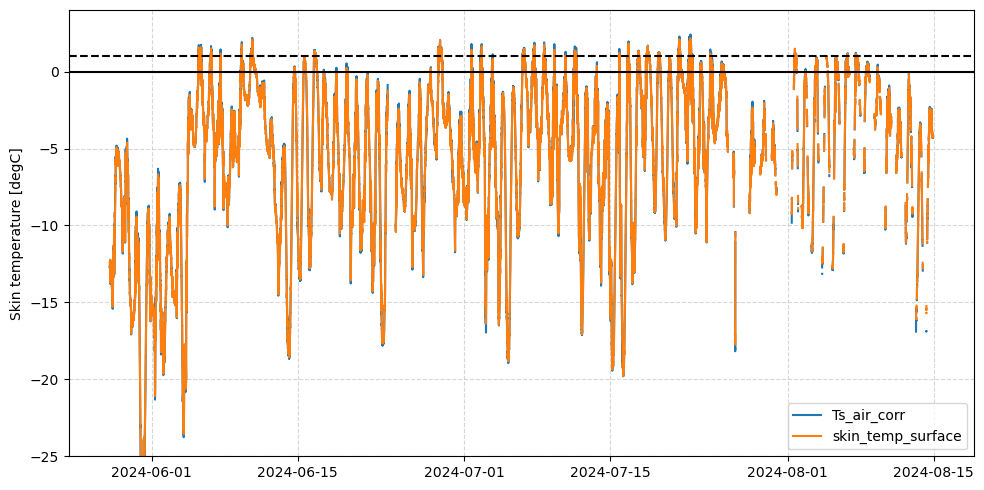

In [16]:
fig, ax = plt.subplots(1, figsize=(10,5))

for varname in ['Ts_air_corr', 'skin_temp_surface']:
    plt.plot(asfs_data_lev1['dates'], asfs_data_lev1[varname], label=varname)

# plt.xlim(datetime.datetime(2024,6,3),datetime.datetime(2024,7,26))
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
plt.ylim(-25,4)
plt.ylabel('Skin temperature [degC]')
plt.tight_layout()
plt.show()

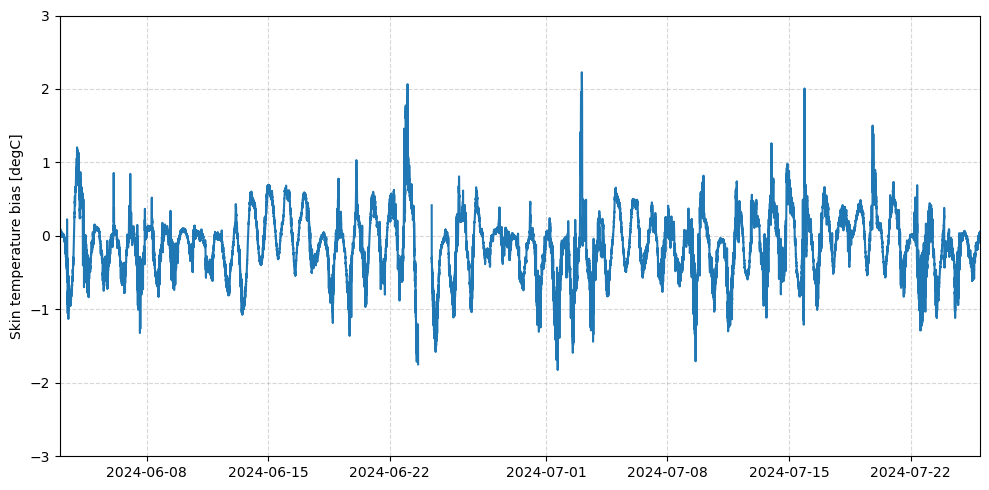

In [17]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(asfs_data_lev1['dates'], asfs_data_lev1['lwu_air_bias'],)

plt.xlim(datetime.datetime(2024,6,3),datetime.datetime(2024,7,26))
# plt.legend(loc='best')
# plt.axhline(y=0, c='k')
# plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
plt.ylim(-3,3)
plt.ylabel('Skin temperature bias [degC]')
plt.tight_layout()
plt.show()

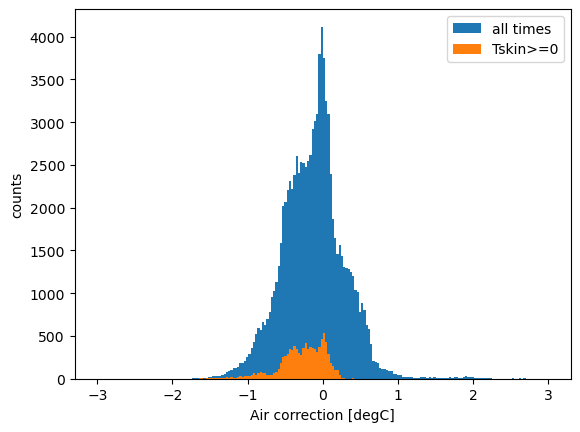

In [18]:
# histogram with all bias corrections and just when Tskin>=0
bins = np.arange(-3,3.01,.03)
bias = asfs_data_lev1['lwu_air_bias'][~asfs_data_lev1['lwu_air_bias'].mask]
plt.hist(bias, bins=bins, label='all times')

plt.hist(bias[np.where(asfs_data_lev1['skin_temp_surface'][~asfs_data_lev1['lwu_air_bias'].mask]>=0)[0]], bins=bins, label='Tskin>=0')
plt.legend(loc='best')
plt.ylabel('counts')
plt.xlabel('Air correction [degC]')
plt.show()

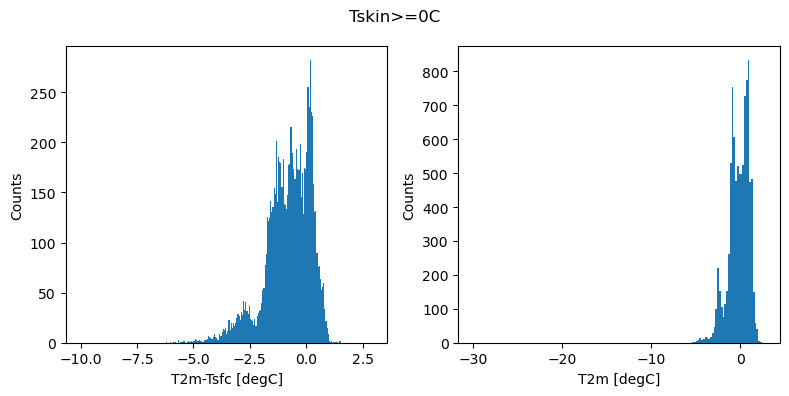

In [19]:
fig, axs = plt.subplots(1,2, figsize=(8,4))

xlabels = {'deltaT':'T2m-Tsfc [degC]','vaisala_T_Avg':'T2m [degC]'}
varbins = {'deltaT':np.arange(-10,3,.05),'vaisala_T_Avg':np.arange(-30,3,.2)}
warm_idx = np.where(asfs_data_lev1['skin_temp_surface']>=0)[0]
for varname, ax in zip(['deltaT','vaisala_T_Avg'], axs.ravel()):
    pltvar = asfs_data_lev1[varname][warm_idx]
    ax.hist(pltvar[~pltvar.mask], bins=varbins[varname])
    ax.set_ylabel('Counts')
    ax.set_xlabel(xlabels[varname])
fig.suptitle('Tskin>=0C')
plt.tight_layout()
plt.show()

### Sanity check: SPN total and SWD as sanity check

In [14]:
for varname in ['sr30_swd_IrrC_Avg','spn1_tot_Avg']:
    asfs_data_lev1[varname] = np.ma.masked_outside(asfs_data_lev1[varname], 0, 2000)

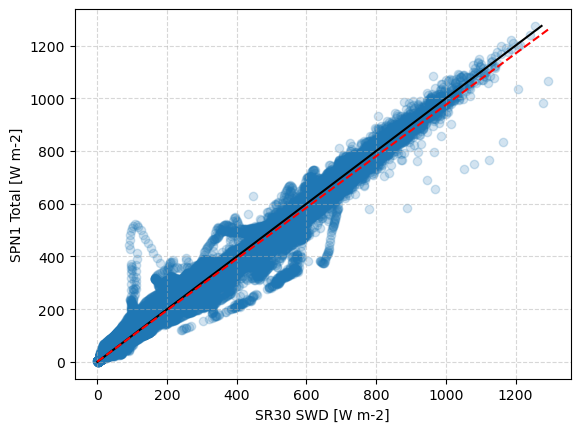

In [22]:
plt.scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'], asfs_data_lev1['spn1_tot_Avg'], alpha=.2)

minval = min(asfs_data_lev1['sr30_swd_IrrC_Avg'].min(), asfs_data_lev1['spn1_tot_Avg'].min())
maxval = min(asfs_data_lev1['sr30_swd_IrrC_Avg'].max(), asfs_data_lev1['spn1_tot_Avg'].max())

plt.plot([minval, maxval],[minval, maxval], c='k')
xs = asfs_data_lev1['sr30_swd_IrrC_Avg']
ys_lr = asfs_data_lev1['spn1_tot_Avg']
plt.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(xs, ys_lr, 1))(np.ma.unique(xs)), c='r', ls='--')

plt.xlabel('SR30 SWD [W m-2]')
plt.ylabel('SPN1 Total [W m-2]')
plt.grid(alpha=.5, ls='--')
# plt.savefig('Raven2024_SR30-SWD_SPN1-TOT.png', dpi=250)
plt.show()

### Try SZA correction because the air temperature didn't change it

In [15]:
# save fraction of diffuse/total from SPN
asfs_data_lev1['diffuse_frac'] = asfs_data_lev1['spn1_dif_Avg']/asfs_data_lev1['spn1_tot_Avg']

In [16]:
asfs_data_lev1['albedo'] = asfs_data_lev1['sr30_swu_IrrC_Avg']/asfs_data_lev1['sr30_swd_IrrC_Avg']
asfs_data_lev1['SWN'] = asfs_data_lev1['sr30_swd_IrrC_Avg'] - asfs_data_lev1['sr30_swu_IrrC_Avg']

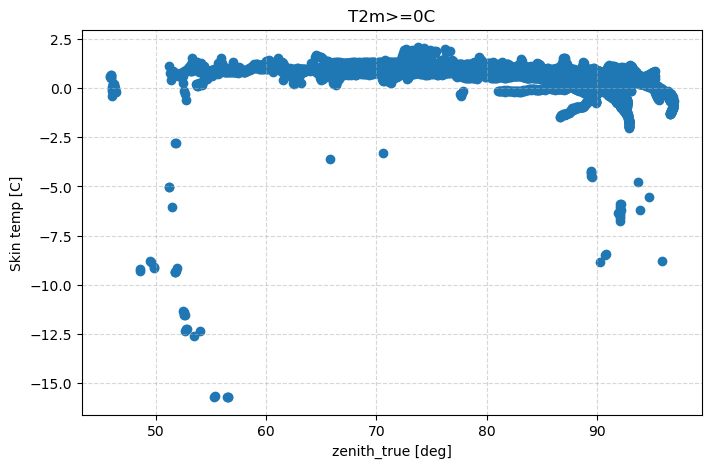

In [18]:
T2m_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, ax = plt.subplots(1, figsize=(8,5))
cb = plt.scatter(asfs_data_lev1['zenith_true'][T2m_idx], asfs_data_lev1['skin_temp_surface'][T2m_idx], label='T2m>=0',)
           # c=asfs_data_lev1['diffuse_frac'][T2m_idx])
# plt.colorbar(cb, label='diffuse/total')
plt.ylabel('Skin temp [C]')
plt.xlabel('zenith_true [deg]')
# plt.legend(loc='best')
plt.grid(alpha=.5, ls='--')
plt.title('T2m>=0C')
plt.show()

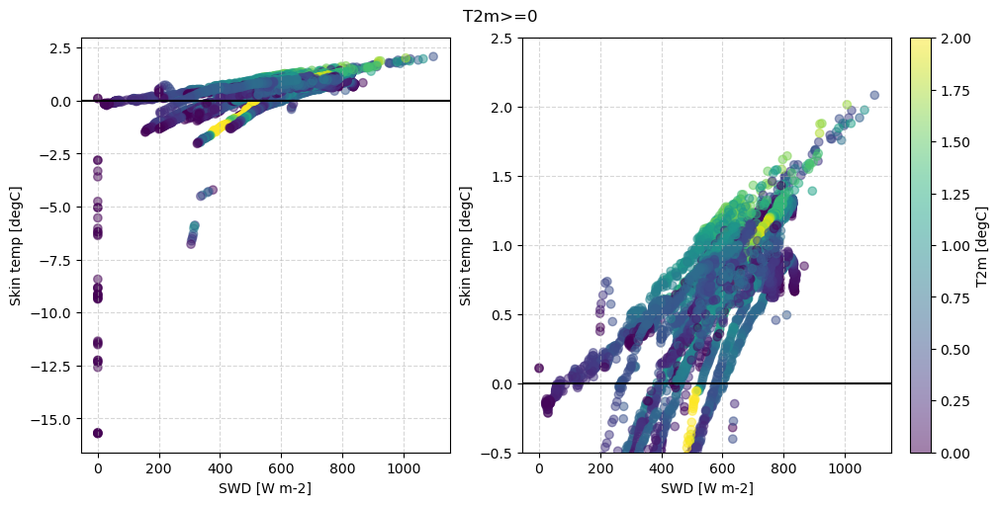

In [19]:
T2m_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][T2m_idx], alpha=.5, c=asfs_data_lev1['vaisala_T_Avg'][T2m_idx],
                   vmin=0, vmax=2)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

plt.colorbar(cb, label='T2m [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_warmT2m.png')

plt.show()

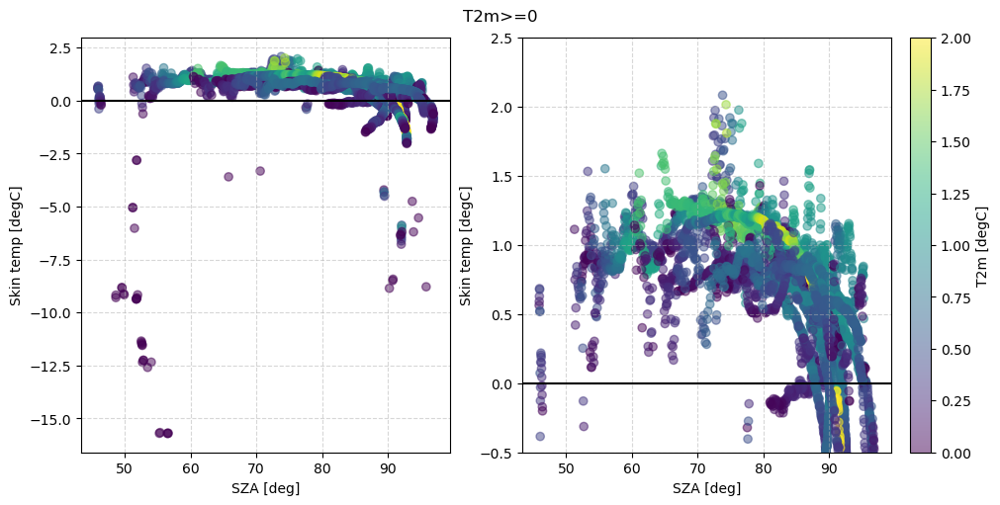

In [19]:
T2m_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['zenith_true'][T2m_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][T2m_idx], alpha=.5, c=asfs_data_lev1['vaisala_T_Avg'][T2m_idx],
                   vmin=0, vmax=2)
    ax.set_xlabel('SZA [deg]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

plt.colorbar(cb, label='T2m [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SZA-skinT_T2mcbar_warmT2m.png')

plt.show()

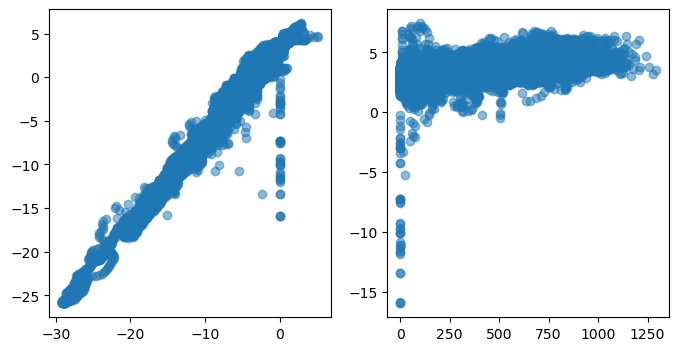

In [77]:
fig, axs = plt.subplots(1,2, figsize=(8,4))
axs[0].scatter(asfs_data_lev1['vaisala_T_Avg'], asfs_data_lev1['ir20_lwu_DegC_Avg'], alpha=.5)
axs[1].scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'], asfs_data_lev1['ir20_lwu_DegC_Avg']-asfs_data_lev1['vaisala_T_Avg'], alpha=.5)

plt.show()

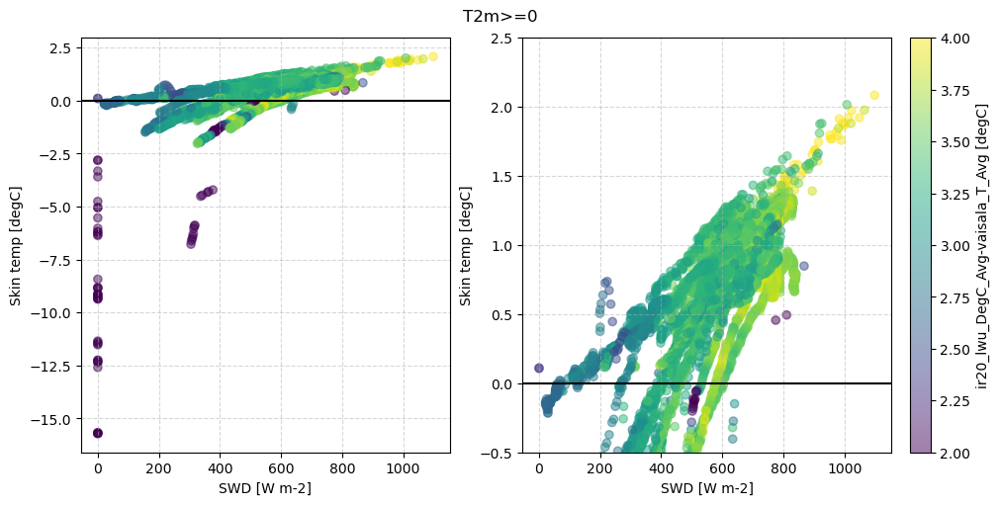

In [84]:
T2m_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][T2m_idx], alpha=.5, 
                    c=(asfs_data_lev1['ir20_lwu_DegC_Avg']-asfs_data_lev1['vaisala_T_Avg'])[T2m_idx],
                   vmin=2, vmax=4)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

plt.colorbar(cb, label='ir20_lwu_DegC_Avg-vaisala_T_Avg [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_warmT2m.png')

plt.show()

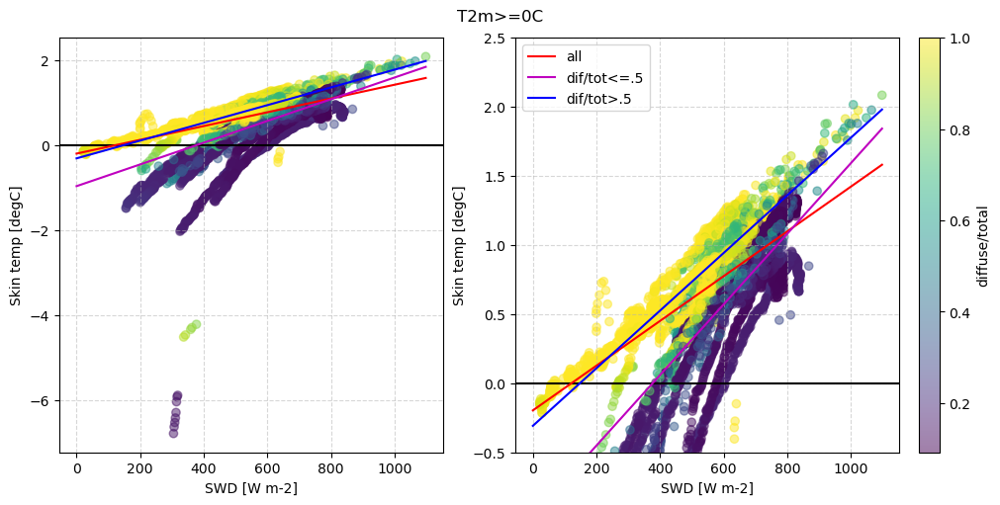

In [125]:
T2m_idx = warm_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][T2m_idx]
cs = asfs_data_lev1['diffuse_frac'][T2m_idx]

ys_lr = np.ma.masked_less(ys, 0)

for ax in axs.ravel():
    cb = ax.scatter(xs, 
                    ys, alpha=.5, c=cs)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

    # make two best fit lines based on diffuse/total
    ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(xs, ys_lr, 1))(np.ma.unique(xs)), c='r', label='all')
    ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs>.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='m', label='dif/tot<=.5')
    ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs<=.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='b', label='dif/tot>.5')
axs[1].legend(loc='best')
plt.colorbar(cb, label='diffuse/total', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_difraccbar_warmT2m.png')

plt.show()

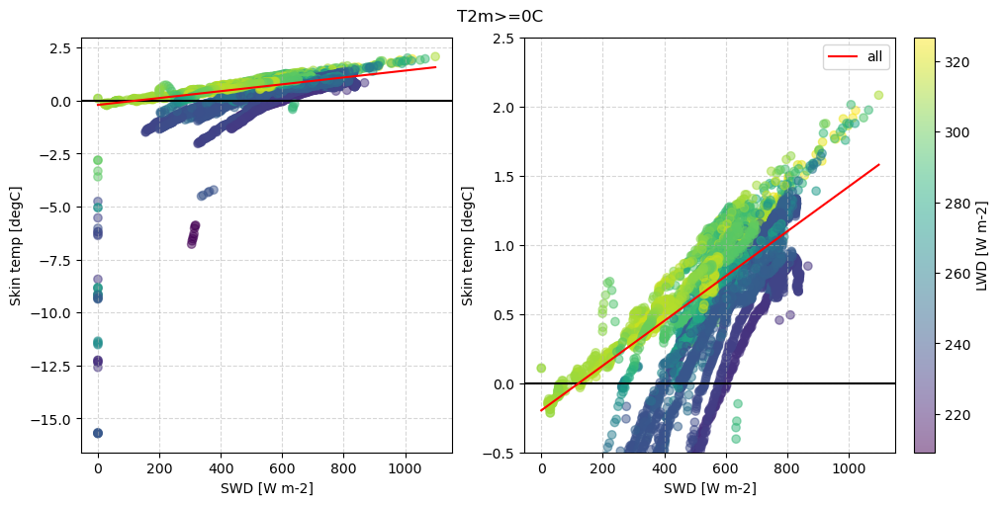

In [17]:
T2m_idx = warm_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][T2m_idx]
cs = asfs_data_lev1['ir20_lwd_Wm2_Avg'][T2m_idx]

ys_lr = np.ma.masked_less(ys, 0)

for ax in axs.ravel():
    cb = ax.scatter(xs, 
                    ys, alpha=.5, c=cs)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

    # make two best fit lines based on diffuse/total
    ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(xs, ys_lr, 1))(np.ma.unique(xs)), c='r', label='all')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs>.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='m', label='dif/tot<=.5')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs<=.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='b', label='dif/tot>.5')
axs[1].legend(loc='best')
plt.colorbar(cb, label='LWD [W m-2]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_LWDccbar_warmT2m.png')

plt.show()

In [17]:
asfs_data_lev1['SWN'] = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'], 0,2000)-np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'], 0,2000)


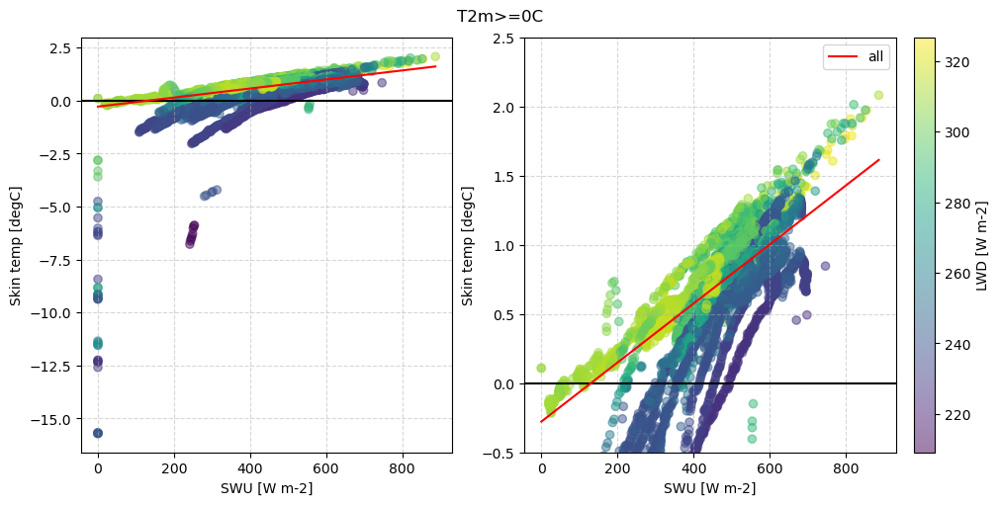

In [20]:
T2m_idx = warm_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

# xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000)-np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'][T2m_idx], 0,2000)
xs = np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'][T2m_idx], 0,2000)

ys = asfs_data_lev1['skin_temp_surface'][T2m_idx]
cs = asfs_data_lev1['ir20_lwd_Wm2_Avg'][T2m_idx]

ys_lr = np.ma.masked_less(ys, 0)

for ax in axs.ravel():
    cb = ax.scatter(xs, 
                    ys, alpha=.5, c=cs)
    ax.set_xlabel('SWU [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

    # make two best fit lines based on diffuse/total
    ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(xs, ys_lr, 1))(np.ma.unique(xs)), c='r', label='all')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs>.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='m', label='dif/tot<=.5')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs<=.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='b', label='dif/tot>.5')
axs[1].legend(loc='best')
plt.colorbar(cb, label='LWD [W m-2]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWU-skinT_LWDccbar_warmT2m.png')

plt.show()

In [28]:
## need to execute cells for promice ice below - should rearrange
wspd_asfs = f(dt_to_seconds(asfs_data_lev1['dates']) )
## 

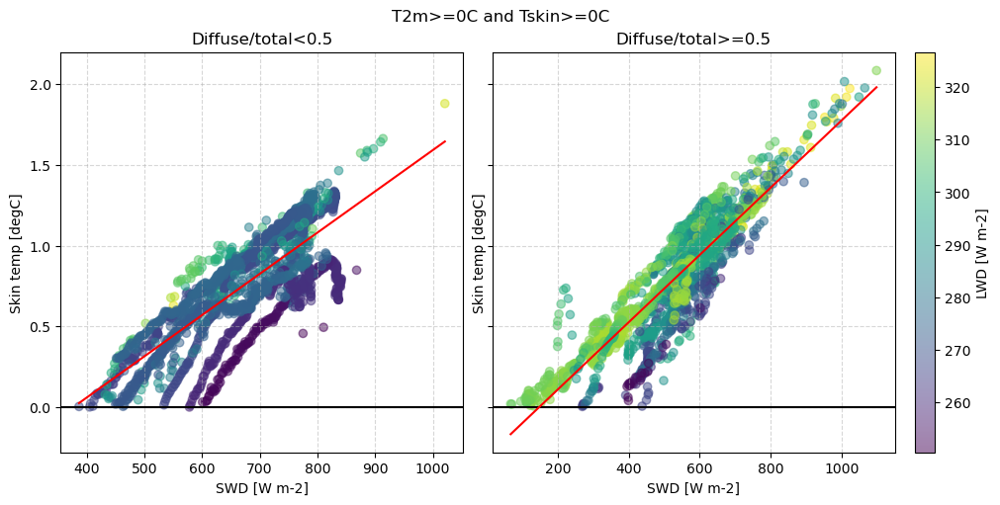

In [25]:
warm_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']>=0)&(asfs_data_lev1['skin_temp_surface']>0) )[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True, sharey=True)

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][warm_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_idx]
difrac = asfs_data_lev1['diffuse_frac'][warm_idx]

T2m = asfs_data_lev1['vaisala_T_Avg'][warm_idx]
cs = asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]

diffuse_xs = np.ma.masked_where(difrac<=.5,xs)
clear_xs = np.ma.masked_where(difrac>.5,xs)

# ys_lr = np.ma.masked_less(ys, 0)

for ax, ax_xs, title in zip(axs.ravel(), [clear_xs, diffuse_xs], ['Diffuse/total<0.5', 'Diffuse/total>=0.5']):
    cb = ax.scatter(ax_xs, 
                    ys, alpha=.5, c=cs)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    ax.set_title(title)

    # make two best fit lines based on diffuse/total
    ax.plot(np.ma.unique(ax_xs), np.poly1d(np.ma.polyfit(ax_xs, ys, 1))(np.ma.unique(ax_xs)), c='r', label='all')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs>.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='m', label='dif/tot<=.5')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs<=.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='b', label='dif/tot>.5')
# axs[1].legend(loc='best')
plt.colorbar(cb, ax=axs[1], label='LWD [W m-2]')

# axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C and Tskin>=0C')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_warmT2m-Tskin_diffrac.png')

plt.show()

In [72]:
print(cs[~xs.mask].min(), cs[~xs.mask].max())

224.6691 326.5854


In [18]:
lwd_bins = np.arange(220, 331,5)

In [45]:
print(len(lwd_bins))

12


In [46]:
print(np.ma.polyfit(a_xs, a_ys, 1))

[ 0.00209631 -0.5375095 ]


### Currently switched to SWU instead of SWD

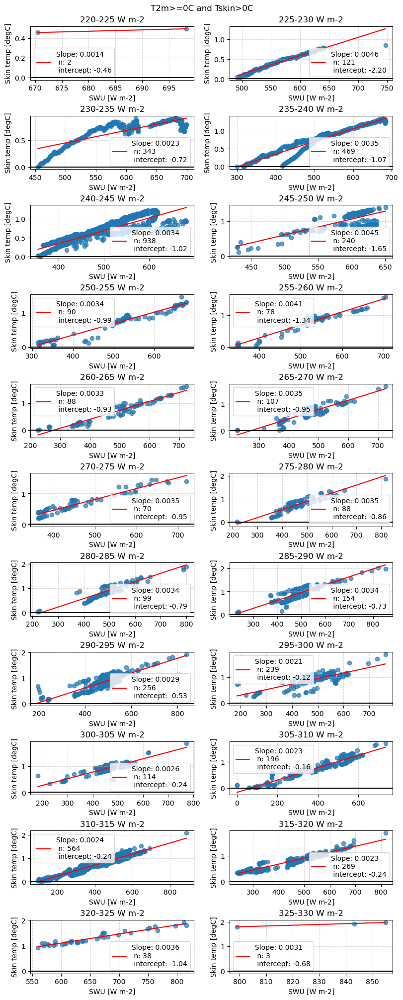

In [19]:
warm_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']>=0)&(asfs_data_lev1['skin_temp_surface']>0) )[0]

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'][warm_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_idx]

fig, axs = plt.subplots(11,2, constrained_layout=True, figsize=(8,20))

intercepts = []
slopes = []
for lower, upper, ax in zip(lwd_bins[:-1], lwd_bins[1:], axs.ravel()):
    a_idx = np.where( (asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]>=lower)&(asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]<upper) )[0]
    a_xs = xs[a_idx]
    a_ys = ys[a_idx]
    
    ax.scatter(a_xs, a_ys, alpha=.7)
    slope, b = np.ma.polyfit(a_xs, a_ys, 1)
    intercepts.append(b)
    slopes.append(slope)
    ax.plot(np.ma.unique(a_xs), np.poly1d(np.ma.polyfit(a_xs, a_ys, 1))(np.ma.unique(a_xs)), c='r', 
            label='Slope: {:.4f}\n n: {:.0f}\n intercept: {:.2f}'.format(slope, a_xs.count(), b))

    ax.set_xlabel('SWU [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    ax.set_title(str(lower)+'-'+str(upper)+' W m-2')
    ax.legend(loc='best')
fig.suptitle('T2m>=0C and Tskin>0C')

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWU-skinT-regressions_5LWD-bins.png')

plt.show()

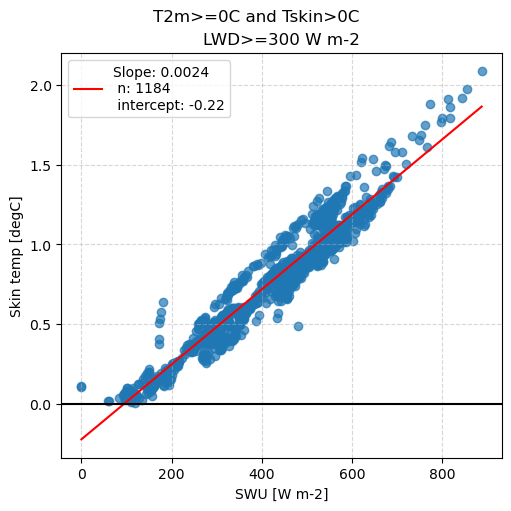

In [18]:
warm_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']>=0)&(asfs_data_lev1['skin_temp_surface']>0) )[0]

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swu_IrrC_Avg'][warm_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_idx]

fig, ax = plt.subplots(1, constrained_layout=True, figsize=(5,5))


# for lower, upper, ax in zip(lwd_bins[:-1], lwd_bins[1:], axs.ravel()):
a_idx = np.where( asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]>=300 )[0]
a_xs = xs[a_idx]
a_ys = ys[a_idx]

ax.scatter(a_xs, a_ys, alpha=.7)
slope, b = np.ma.polyfit(a_xs, a_ys, 1)
lwd_300_intercept = b
lwd_300_slope = slope
ax.plot(np.ma.unique(a_xs), np.poly1d(np.ma.polyfit(a_xs, a_ys, 1))(np.ma.unique(a_xs)), c='r', 
        label='Slope: {:.4f}\n n: {:.0f}\n intercept: {:.2f}'.format(slope, a_xs.count(), b))

ax.set_xlabel('SWU [W m-2]')
ax.set_ylabel('Skin temp [degC]')
ax.grid(alpha=.5, ls='--')
ax.axhline(y=0, c='k')
ax.set_title('LWD>=300 W m-2')
ax.legend(loc='best')


fig.suptitle('T2m>=0C and Tskin>0C')

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWU-skinT-regressions_5LWD-bins.png')

plt.show()

NameError: name 'intercepts' is not defined

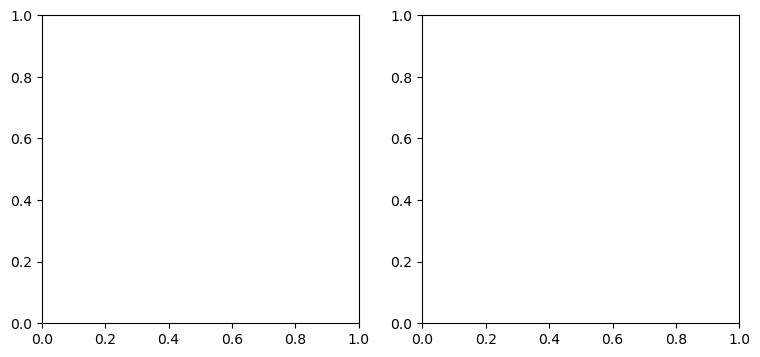

In [19]:
fig, axs = plt.subplots(1,2, figsize=(9,4))


for ax, yl, vardata in zip(axs.ravel(), ['Bin intercept', 'Bin slope'], [intercepts, slopes]):

    ax.scatter(lwd_bins[1:-2]+2.5, vardata[1:-1])

    
    slope, b = np.ma.polyfit(lwd_bins[1:-2], vardata[1:-1], 1)
    print(yl, slope, b)
    ax.plot(np.ma.unique(lwd_bins[1:-2]), np.poly1d(np.ma.polyfit(lwd_bins[1:-2], vardata[1:-1], 1))(np.ma.unique(lwd_bins[1:-2])), c='r', 
            label='Slope: {:.5f}\nintercept: {:.4f}\nmean: {:.4f}'.format(slope, b, np.ma.mean(vardata[1:])))

    ax.set_ylabel(yl)
    ax.set_xlabel('LWD bin midpoint [W m-2]')
    ax.legend(loc='best')
plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWU-skinT-regressions_5LWD-bins_correction-slope-intercept.png')
plt.show()

In [20]:
def calc_swd_correction(lwd, swd):
    ## precision matters!!!!
    
    sw_slope = lwd*-1.395177183202686e-05 + 0.006496826201376216
    sw_intercept = lwd*0.01588047925484695 - 5.186842147205883
    
    correction = swd*sw_slope + sw_intercept
    return correction
    

In [21]:
def calc_swu_correction(lwd, swu):
    ## precision matters!!!!
    
    sw_slope = lwd*-1.4106987760423064e-05 + 0.007075662978268978
    sw_intercept = lwd*0.012687018731278917 - 4.2965625296529755
    
    correction = swu*sw_slope + sw_intercept
    return correction
    

In [22]:
def calc_swu_correction_no_lwd(swu):
    ## precision matters!!!!
    
    correction = swu*lwd_300_slope + lwd_300_intercept
    return correction
    

In [63]:
print(lwd_300_intercept, lwd_300_slope)

-0.2214795415197989 0.002350659890433026


In [21]:
cool_lwd_bins = np.arange(210,321,10)

In [22]:
print(asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_ts_idx].min(), asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_ts_idx].max())

214.7359 319.9516


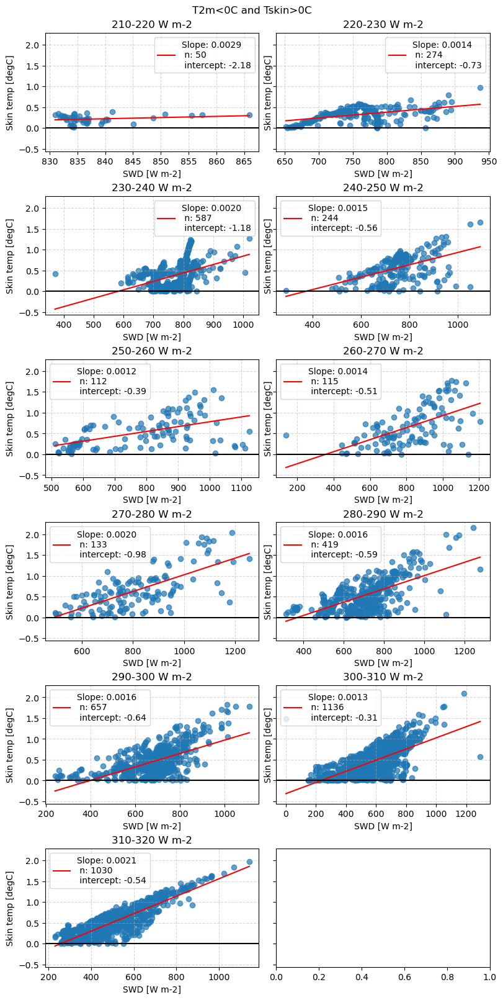

In [42]:
### repeat w/ skin temperatures above 0 but not T2m above 0
warm_ts_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']<0)&(asfs_data_lev1['skin_temp_surface']>0) )[0]
xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][warm_ts_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_ts_idx]

fig, axs = plt.subplots(6,2, constrained_layout=True, figsize=(8,16), sharey=True)
intercepts_cool = []
for lower, upper, ax in zip(cool_lwd_bins[:-1], cool_lwd_bins[1:], axs.ravel()):
    a_idx = np.where( (asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_ts_idx]>=lower)&(asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_ts_idx]<upper) )[0]
    a_xs = xs[a_idx]
    a_ys = ys[a_idx]
    
    ax.scatter(a_xs, a_ys, alpha=.7)
    slope, b = np.ma.polyfit(a_xs, a_ys, 1)
    intercepts_cool.append(b)
    ax.plot(np.ma.unique(a_xs), np.poly1d(np.ma.polyfit(a_xs, a_ys, 1))(np.ma.unique(a_xs)), c='r', 
            label='Slope: {:.4f}\n n: {:.0f}\n intercept: {:.2f}'.format(slope, a_xs.count(), b))

    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    ax.set_title(str(lower)+'-'+str(upper)+' W m-2')
    ax.legend(loc='best')
fig.suptitle('T2m<0C and Tskin>0C')

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT-regressions_LWD-bins.png')

plt.show()

In [28]:
print(asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx].min(), asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx].max())

-5.220138 2.294785


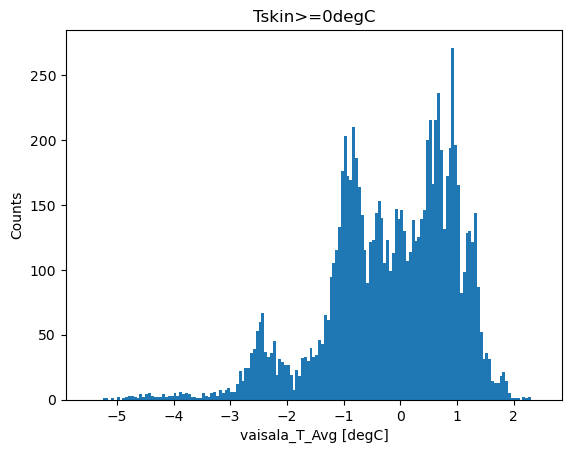

In [31]:
plt.hist(asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx], bins=np.arange(-5.5,2.5,.05))
plt.xlabel('vaisala_T_Avg [degC]')
plt.ylabel('Counts')
plt.title('Tskin>=0degC')
plt.show()

In [33]:
print(T2m_bins)

[-5.  -4.5 -4.  -3.5 -3.  -2.5 -2.  -1.5 -1.  -0.5  0.   0.5  1.   1.5
  2. ]


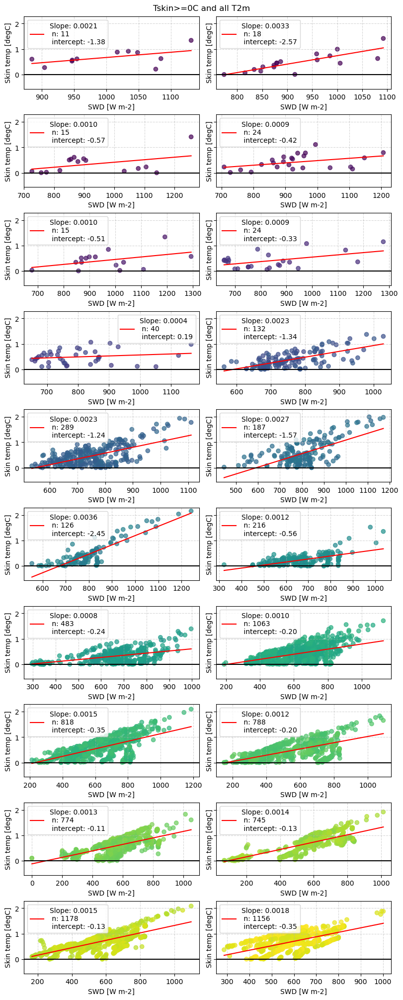

In [41]:
# try binning by T2m

T2m_bins = np.arange(-5,2.1,.3)
warm_ts_idx = np.where( asfs_data_lev1['skin_temp_surface']>0 )[0]
xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][warm_ts_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_ts_idx]

fig, axs = plt.subplots(10,2, constrained_layout=True, figsize=(8,20), sharey=True)
intercepts_cool = []
for lower, upper, ax in zip(T2m_bins[:-1], T2m_bins[1:], axs.ravel()):
    a_idx = np.where( (asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx]>=lower)&(asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx]<upper) )[0]
    # print(lower, upper,a_idx)
    a_xs = xs[a_idx]
    a_ys = ys[a_idx]
    
    ax.scatter(a_xs, a_ys, alpha=.7, c=asfs_data_lev1['vaisala_T_Avg'][warm_ts_idx][a_idx], vmin=-4,vmax=1)
    slope, b = np.ma.polyfit(a_xs, a_ys, 1)
    intercepts_cool.append(b)
    ax.plot(np.ma.unique(a_xs), np.poly1d(np.ma.polyfit(a_xs, a_ys, 1))(np.ma.unique(a_xs)), c='r', 
            label='Slope: {:.4f}\n n: {:.0f}\n intercept: {:.2f}'.format(slope, a_xs.count(), b))

    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    # ax.set_title(str(lower)+'-'+str(upper)+' C')
    ax.legend(loc='best')
fig.suptitle('Tskin>=0C and all T2m')

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT-regressions_LWD-bins.png')

plt.show()

Repeat correction with SWN instead of SWD - more potential for being applied to other sites

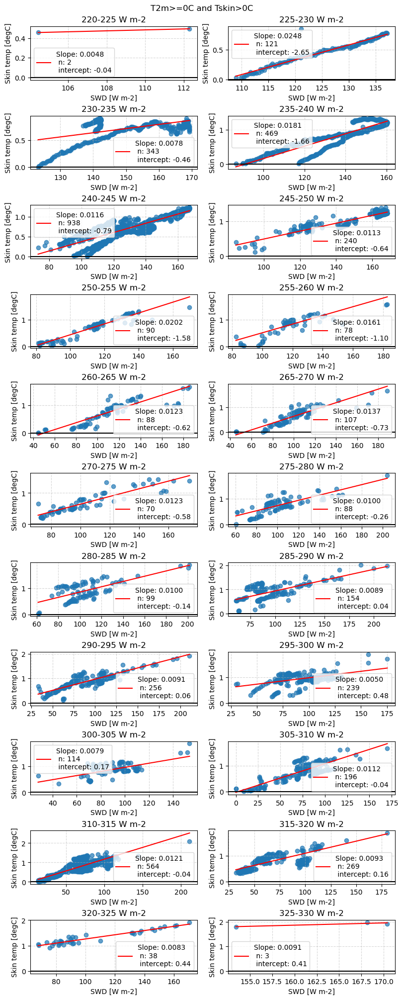

In [36]:
warm_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']>=0)&(asfs_data_lev1['skin_temp_surface']>0) )[0]

xs = asfs_data_lev1['SWN'][warm_idx]
ys = asfs_data_lev1['skin_temp_surface'][warm_idx]

fig, axs = plt.subplots(11,2, constrained_layout=True, figsize=(8,20))

intercepts = []
slopes = []
for lower, upper, ax in zip(lwd_bins[:-1], lwd_bins[1:], axs.ravel()):
    a_idx = np.where( (asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]>=lower)&(asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]<upper) )[0]
    a_xs = xs[a_idx]
    a_ys = ys[a_idx]
    
    ax.scatter(a_xs, a_ys, alpha=.7)
    slope, b = np.ma.polyfit(a_xs, a_ys, 1)
    intercepts.append(b)
    slopes.append(slope)
    ax.plot(np.ma.unique(a_xs), np.poly1d(np.ma.polyfit(a_xs, a_ys, 1))(np.ma.unique(a_xs)), c='r', 
            label='Slope: {:.4f}\n n: {:.0f}\n intercept: {:.2f}'.format(slope, a_xs.count(), b))

    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    ax.set_title(str(lower)+'-'+str(upper)+' W m-2')
    ax.legend(loc='best')
fig.suptitle('T2m>=0C and Tskin>0C')

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWN-skinT-regressions_5LWD-bins.png')

plt.show()

Bin intercept 0.021678469945435746 -6.4042819632782955
Bin slope -9.626731594216706e-05 0.038235815976927184


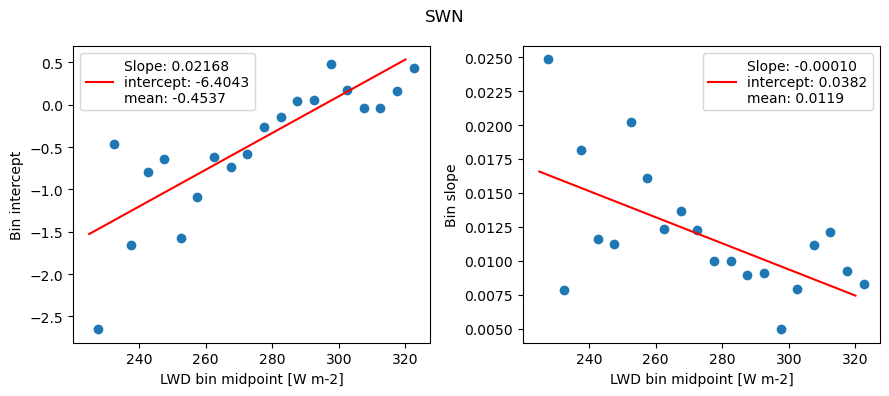

In [38]:
fig, axs = plt.subplots(1,2, figsize=(9,4))


for ax, yl, vardata in zip(axs.ravel(), ['Bin intercept', 'Bin slope'], [intercepts, slopes]):

    ax.scatter(lwd_bins[1:-2]+2.5, vardata[1:-1])

    
    slope, b = np.ma.polyfit(lwd_bins[1:-2], vardata[1:-1], 1)
    print(yl, slope, b)
    ax.plot(np.ma.unique(lwd_bins[1:-2]), np.poly1d(np.ma.polyfit(lwd_bins[1:-2], vardata[1:-1], 1))(np.ma.unique(lwd_bins[1:-2])), c='r', 
            label='Slope: {:.5f}\nintercept: {:.4f}\nmean: {:.4f}'.format(slope, b, np.ma.mean(vardata[1:])))

    ax.set_ylabel(yl)
    ax.set_xlabel('LWD bin midpoint [W m-2]')
    ax.legend(loc='best')
fig.suptitle('SWN')
plt.tight_layout()

# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT-regressions_5LWD-bins_correction-slope-intercept.png')
plt.show()

In [23]:
def calc_swnet_correction(lwd, swn):
    ## precision matters!!!!
    
    sw_slope = lwd*-9.626731594216706e-05 + 0.038235815976927184
    sw_intercept = lwd*0.021678469945435746 - 6.4042819632782955
    
    correction = swn*sw_slope + sw_intercept
    return correction
    

In [24]:
solar_net_correction = calc_sw_correction(asfs_data_lev1['ir20_lwd_Wm2_Avg'], asfs_data_lev1['sr30_swd_IrrC_Avg'])

solar_net_correction[np.where(solar_net_correction<0)[0]] = 0.

solar_net_correct_tskin = asfs_data_lev1['skin_temp_surface'] - solar_net_correction

NameError: name 'calc_sw_correction' is not defined

In [25]:
solar_up_correction = calc_swu_correction(asfs_data_lev1['ir20_lwd_Wm2_Avg'], asfs_data_lev1['sr30_swu_IrrC_Avg'])

solar_up_correction[np.where(solar_up_correction<0)[0]] = 0.

solar_up_correct_tskin = asfs_data_lev1['skin_temp_surface'] - solar_up_correction

In [26]:
solar_up_correction_nolwd = calc_swu_correction_no_lwd(asfs_data_lev1['sr30_swu_IrrC_Avg'])

solar_up_correction_nolwd[np.where(solar_up_correction_nolwd<0)[0]] = 0.

solar_up_correct_tskin_nolwd = asfs_data_lev1['skin_temp_surface'] - solar_up_correction_nolwd

NameError: name 'solar_correct_tskin' is not defined

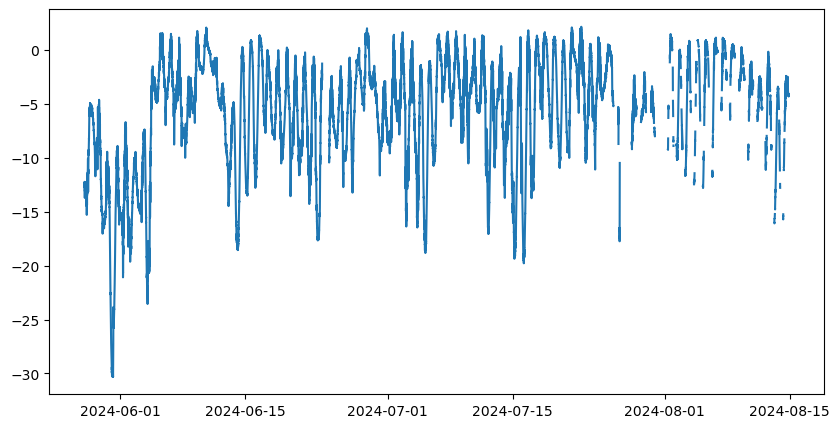

In [26]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(asfs_data_lev1['dates'], asfs_data_lev1['skin_temp_surface'], label='uncorrected')
plt.plot(asfs_data_lev1['dates'], solar_correct_tskin, label='corrected w/ SWD')
plt.plot(asfs_data_lev1['dates'], solar_up_correct_tskin, label='corrected w/ SWN', ls='--')

plt.xlim(datetime.datetime(2024,8,3),datetime.datetime(2024,8,13))
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
# plt.ylim(-25,4)
plt.ylim(-4,4)
plt.ylabel('Skin temperature [degC]')
plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_skinT_solar-correction_subset-perc-event.png')

plt.show()

Looks like SWN and SWD give similar (the same?) results for Raven.....

### apply correction to Tskin

In [34]:
solar_correction = calc_swd_correction(asfs_data_lev1['ir20_lwd_Wm2_Avg'], asfs_data_lev1['sr30_swd_IrrC_Avg'])

solar_correction[np.where(solar_correction<0)[0]] = 0.

solar_correct_tskin = asfs_data_lev1['skin_temp_surface'] - solar_correction

In [29]:
solar_correction_all = calc_swd_correction(asfs_data_lev1['ir20_lwd_Wm2_Avg'], asfs_data_lev1['sr30_swd_IrrC_Avg'])
solar_up_correction_all = calc_swu_correction(asfs_data_lev1['ir20_lwd_Wm2_Avg'], asfs_data_lev1['sr30_swu_IrrC_Avg'])
solar_up_correction_nolwd_all = calc_swu_correction_no_lwd(asfs_data_lev1['sr30_swu_IrrC_Avg'])


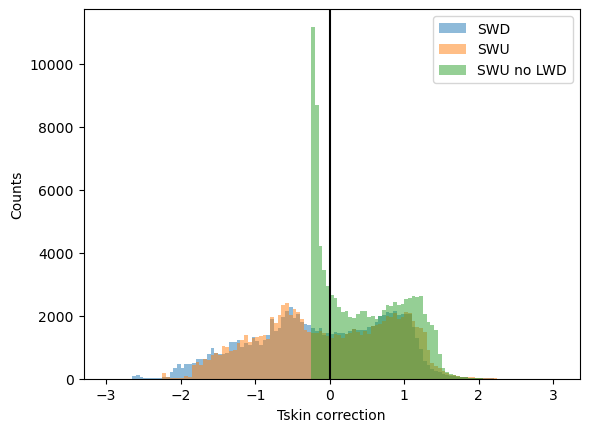

In [30]:
plt.hist(solar_correction_all, bins=np.arange(-3,3.1,.05), alpha=.5, label='SWD')
plt.hist(solar_up_correction_all, bins=np.arange(-3,3.1,.05), alpha=.5, label='SWU')
plt.hist(solar_up_correction_nolwd_all, bins=np.arange(-3,3.1,.05), alpha=.5, label='SWU no LWD')

plt.legend(loc='best')
plt.axvline(x=0, c='k')
plt.ylabel('Counts')
plt.xlabel('Tskin correction')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_skinT-corrections_SWU-SWD.png')

plt.show()

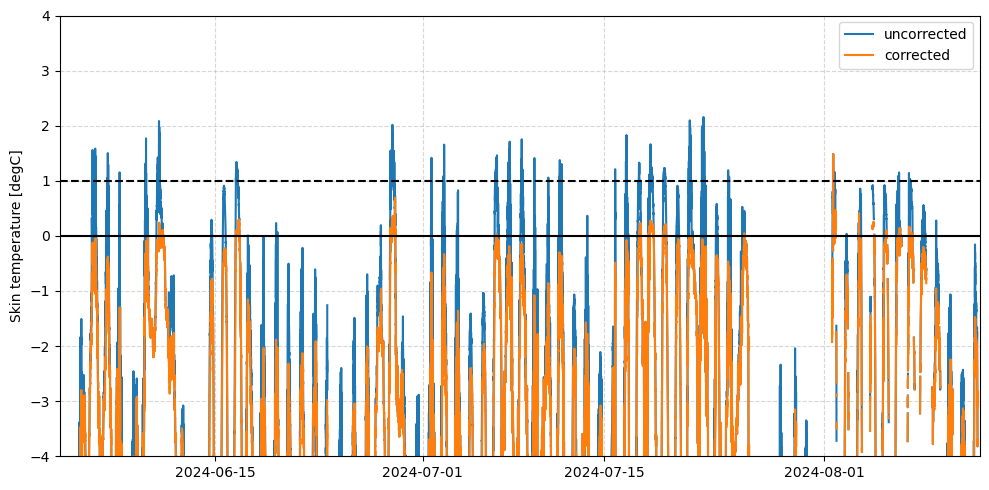

In [24]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(asfs_data_lev1['dates'], asfs_data_lev1['skin_temp_surface'], label='uncorrected')
plt.plot(asfs_data_lev1['dates'], solar_correct_tskin, label='corrected')

plt.xlim(datetime.datetime(2024,6,3),datetime.datetime(2024,8,13))
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
# plt.ylim(-25,4)
plt.ylim(-4,4)
plt.ylabel('Skin temperature [degC]')
plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_skinT_solar-correction_subset-perc-event.png')

plt.show()

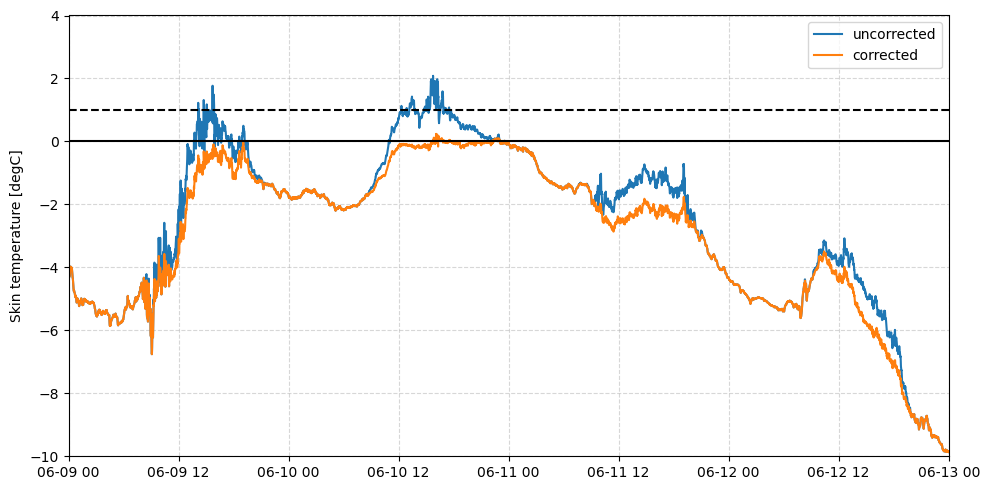

In [20]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(asfs_data_lev1['dates'], asfs_data_lev1['skin_temp_surface'], label='uncorrected')
plt.plot(asfs_data_lev1['dates'], solar_correct_tskin, label='corrected')

plt.xlim(datetime.datetime(2024,6,9),datetime.datetime(2024,6,13))
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
# plt.ylim(-25,4)
plt.ylim(-10,4)
plt.ylabel('Skin temperature [degC]')
plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_skinT_solar-correction_subset-perc-event.png')

plt.show()

In [25]:
## try to make mega plot of multiple times to see if the above example is common or if more work needs to be done

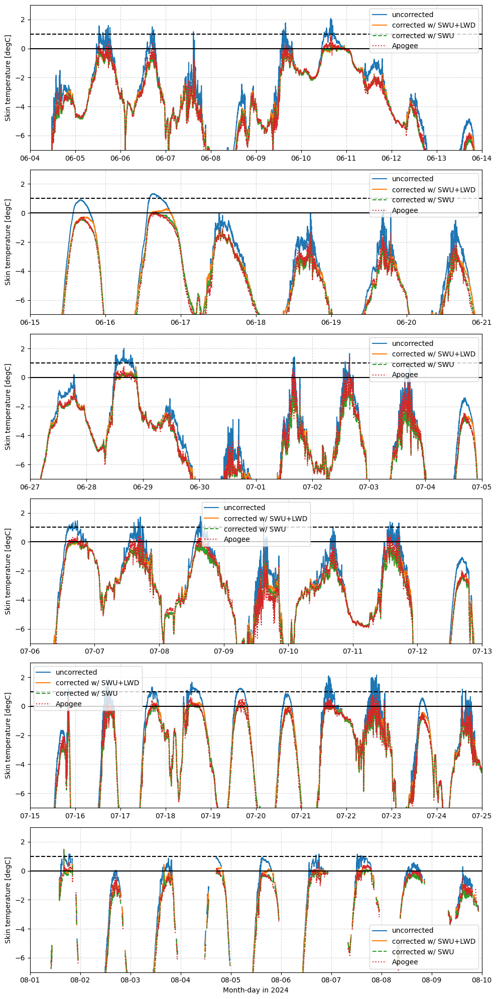

In [28]:
fig, axs = plt.subplots(6, figsize=(10,20))

time_periods = [(datetime.datetime(2024,6,4),datetime.datetime(2024,6,14)),
                (datetime.datetime(2024,6,15),datetime.datetime(2024,6,21)),
                (datetime.datetime(2024,6,27),datetime.datetime(2024,7,5)),
                (datetime.datetime(2024,7,6),datetime.datetime(2024,7,13)),
                (datetime.datetime(2024,7,15),datetime.datetime(2024,7,25)),
                (datetime.datetime(2024,8,1),datetime.datetime(2024,8,10))]

for ax, period in zip(axs.ravel(),time_periods):
    ax.plot(asfs_data_lev1['dates'], asfs_data_lev1['skin_temp_surface'], label='uncorrected')
    ax.plot(asfs_data_lev1['dates'], solar_up_correct_tskin, label='corrected w/ SWU+LWD')
    ax.plot(asfs_data_lev1['dates'], solar_up_correct_tskin_nolwd, ls='--', label='corrected w/ SWU')
    ax.plot(asfs_data_lev1['dates'], asfs_data_lev1['apogee_targ_T_Avg'], ls=':', label='Apogee')

    ax.set_xlim(period[0], period[1])
    ax.set_ylim(-7,3)
    ax.legend(loc='best')
    ax.axhline(y=0, c='k')
    ax.axhline(y=1, c='k', ls='--')
    ax.grid(ls='--', alpha=.5)
    ax.set_ylabel('Skin temperature [degC]')
    ax.xaxis.set_major_formatter(myFmt)
axs[-1].set_xlabel('Month-day in 2024')
plt.tight_layout()
# plt.savefig('Raven_2024_Tskin-corrected_melting-subsets_SWU-versions_apogee.png', dpi=250)
plt.show()

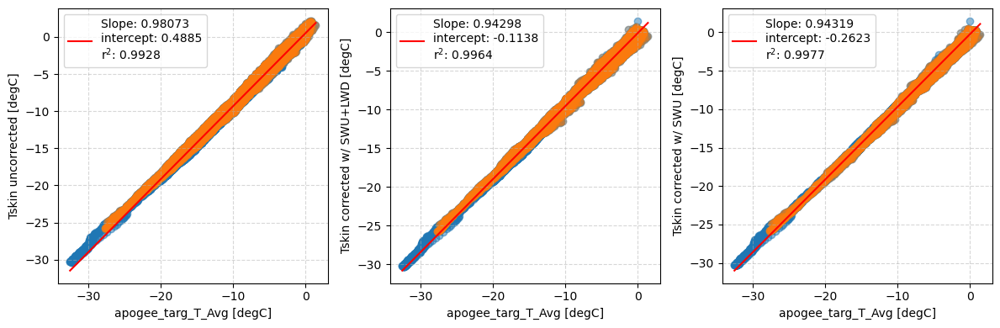

In [65]:
### check which correction is better correlated w/ IRT

fig, axs = plt.subplots(1,3, figsize=(12,4))

xvar = asfs_data_lev1['apogee_targ_T_Avg']

for ax, correct_tskin, label in zip(axs.ravel(), [asfs_data_lev1['skin_temp_surface'], solar_up_correct_tskin, solar_up_correct_tskin_nolwd], ['uncorrected','corrected w/ SWU+LWD','corrected w/ SWU']):
    ax.scatter(xvar, correct_tskin, alpha=.5)

    ## should be correction for SWU and then SWU+LWD, ie different set for each panel
    nozero_idx = np.where(solar_up_correction_nolwd_all>0)[0]
    ax.scatter(xvar[nozero_idx], correct_tskin[nozero_idx], alpha=.2 )
    
    result = stats.linregress(xvar[~xvar.mask], correct_tskin[~xvar.mask])
    # ax.plot(np.ma.unique(xvar), np.poly1d(np.ma.polyfit(xvar, correct_tskin, 1))(np.ma.unique(xvar)), c='r', 
    ax.plot(np.ma.unique(xvar), result.intercept + result.slope*np.ma.unique(xvar), c='r',
            label='Slope: {:.5f}\nintercept: {:.4f}\nr$^2$: {:.4f}'.format(result.slope, result.intercept, result.rvalue**2))
    
    ax.set_ylabel('Tskin '+label+' [degC]')
    ax.set_xlabel('apogee_targ_T_Avg [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.legend(loc='best')

plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_skinT-correct_vs_apogee_targ_T_Avg.png')
plt.show()


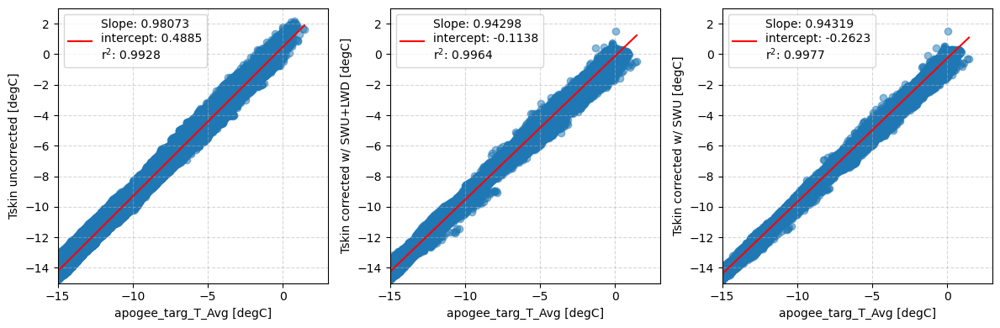

In [57]:
### zoom in to near melt point

fig, axs = plt.subplots(1,3, figsize=(12,4))

xvar = asfs_data_lev1['apogee_targ_T_Avg']

for ax, correct_tskin, label in zip(axs.ravel(), [asfs_data_lev1['skin_temp_surface'], solar_up_correct_tskin, solar_up_correct_tskin_nolwd], ['uncorrected','corrected w/ SWU+LWD','corrected w/ SWU']):
    ax.scatter(xvar, correct_tskin, alpha=.5)
    
    result = stats.linregress(xvar[~xvar.mask], correct_tskin[~xvar.mask])
    # ax.plot(np.ma.unique(xvar), np.poly1d(np.ma.polyfit(xvar, correct_tskin, 1))(np.ma.unique(xvar)), c='r', 
    ax.plot(np.ma.unique(xvar), result.intercept + result.slope*np.ma.unique(xvar), c='r',
            label='Slope: {:.5f}\nintercept: {:.4f}\nr$^2$: {:.4f}'.format(result.slope, result.intercept, result.rvalue**2))
    
    ax.set_ylabel('Tskin '+label+' [degC]')
    ax.set_xlabel('apogee_targ_T_Avg [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.legend(loc='best')

    ax.set_xlim(-15,3)
    ax.set_ylim(-15,3)

plt.tight_layout()
plt.show()


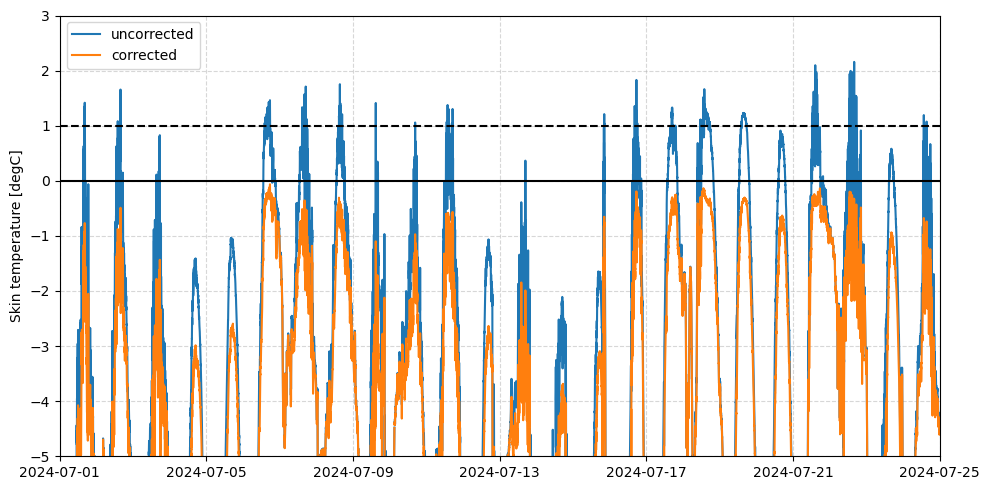

In [42]:
fig, ax = plt.subplots(1, figsize=(10,5))

plt.plot(asfs_data_lev1['dates'], asfs_data_lev1['skin_temp_surface'], label='uncorrected')

solar_correction = 0.002*asfs_data_lev1['sr30_swd_IrrC_Avg']
solar_correct_tskin = asfs_data_lev1['skin_temp_surface'] - solar_correction
plt.plot(asfs_data_lev1['dates'], solar_correct_tskin, label='corrected')

plt.xlim(datetime.datetime(2024,7,1),datetime.datetime(2024,7,25))
plt.ylim(-5,3)
plt.legend(loc='best')
plt.axhline(y=0, c='k')
plt.axhline(y=1, c='k', ls='--')
plt.grid(ls='--', alpha=.5)
# plt.ylim(-25,4)
plt.ylabel('Skin temperature [degC]')
plt.tight_layout()
plt.show()

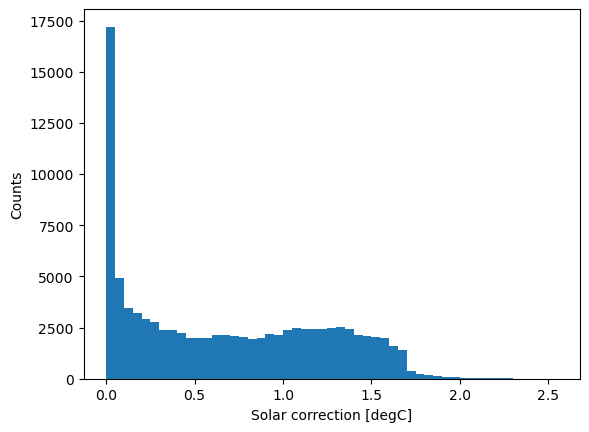

In [34]:
plt.hist(solar_correction[~solar_correction.mask], bins=np.arange(0,2.6,.05))
plt.xlabel('Solar correction [degC]')
plt.ylabel('Counts')
plt.show()

In [61]:
yval = asfs_data_lev1['skin_temp_surface'][warm_idx]
yval = np.ma.masked_less(yval, 0) + 273.1

xs = [np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][warm_idx], 0,2000),
      np.ma.masked_outside(asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx], 0,2000)]

reg_swd_lwd_diff = reg_m(yval, xs)
print(reg_swd_lwd_diff.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     229.3
Date:                Tue, 12 Nov 2024   Prob (F-statistic):           2.47e-96
Time:                        13:37:02   Log-Likelihood:                -32716.
No. Observations:                5454   AIC:                         6.544e+04
Df Residuals:                    5451   BIC:                         6.546e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.8776      0.041     21.214      0.0

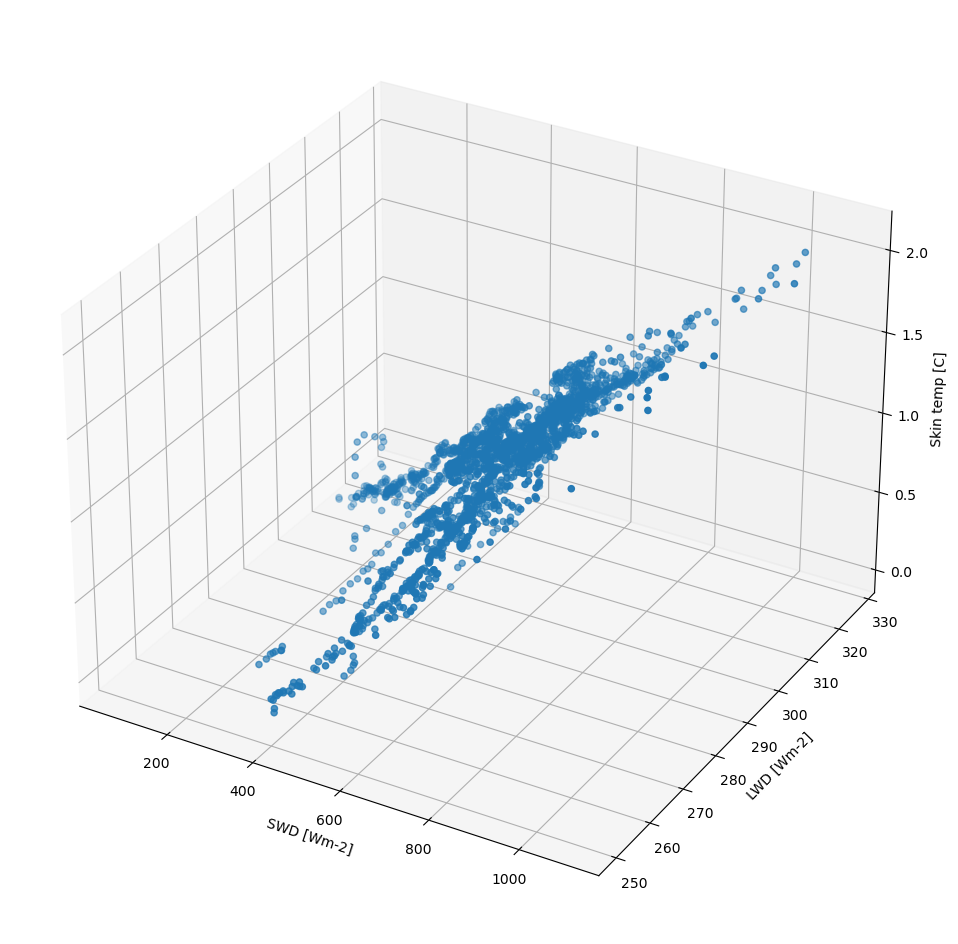

In [69]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')
ax.scatter(diffuse_xs, cs, ys)

ax.set_zlabel('Skin temp [C]')
ax.set_xlabel('SWD [Wm-2]')
ax.set_ylabel('LWD [Wm-2]')

plt.show()

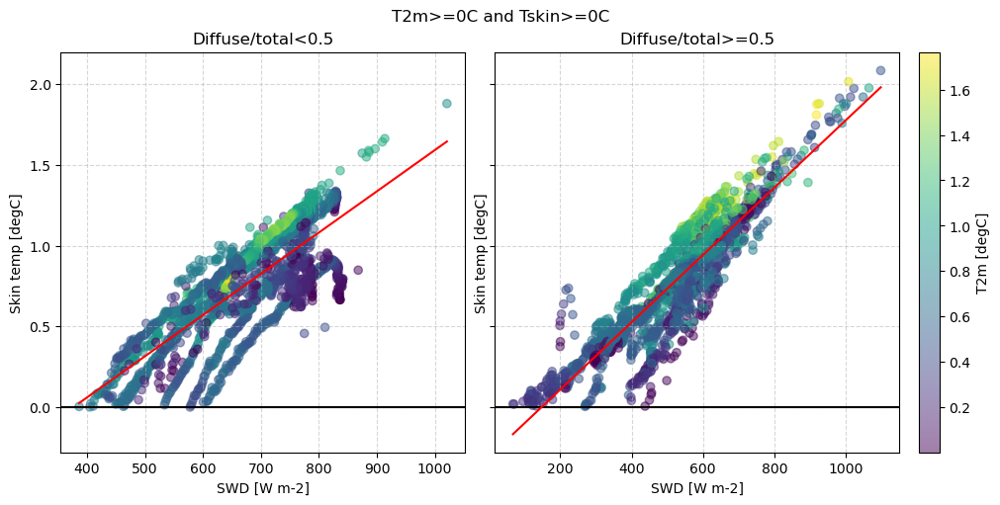

In [43]:
warm_idx = np.where( (asfs_data_lev1['vaisala_T_Avg']>=0)&(asfs_data_lev1['skin_temp_surface']>=0) )[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True, sharey=True)

xs = np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][warm_idx], 0,2000)
ys = asfs_data_lev1['skin_temp_surface'][warm_idx]
difrac = asfs_data_lev1['diffuse_frac'][warm_idx]

T2m = asfs_data_lev1['vaisala_T_Avg'][warm_idx]
cs = T2m#asfs_data_lev1['ir20_lwd_Wm2_Avg'][warm_idx]

diffuse_xs = np.ma.masked_where(difrac<=.5,xs)
clear_xs = np.ma.masked_where(difrac>.5,xs)

# ys_lr = np.ma.masked_less(ys, 0)

for ax, ax_xs, title in zip(axs.ravel(), [clear_xs, diffuse_xs], ['Diffuse/total<0.5', 'Diffuse/total>=0.5']):
    cb = ax.scatter(ax_xs, 
                    ys, alpha=.5, c=cs)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
    ax.set_title(title)

    # make two best fit lines based on diffuse/total
    ax.plot(np.ma.unique(ax_xs), np.poly1d(np.ma.polyfit(ax_xs, ys, 1))(np.ma.unique(ax_xs)), c='r', label='all')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs>.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='m', label='dif/tot<=.5')
    # ax.plot(np.ma.unique(xs), np.poly1d(np.ma.polyfit(np.ma.masked_where(cs<=.5,xs), ys_lr, 1))(np.ma.unique(xs)), c='b', label='dif/tot>.5')
# axs[1].legend(loc='best')
plt.colorbar(cb, ax=axs[1], label='T2m [degC]')

# axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C and Tskin>=0C')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWU-skinT_T2mcbar_warmT2m.png')

plt.show()

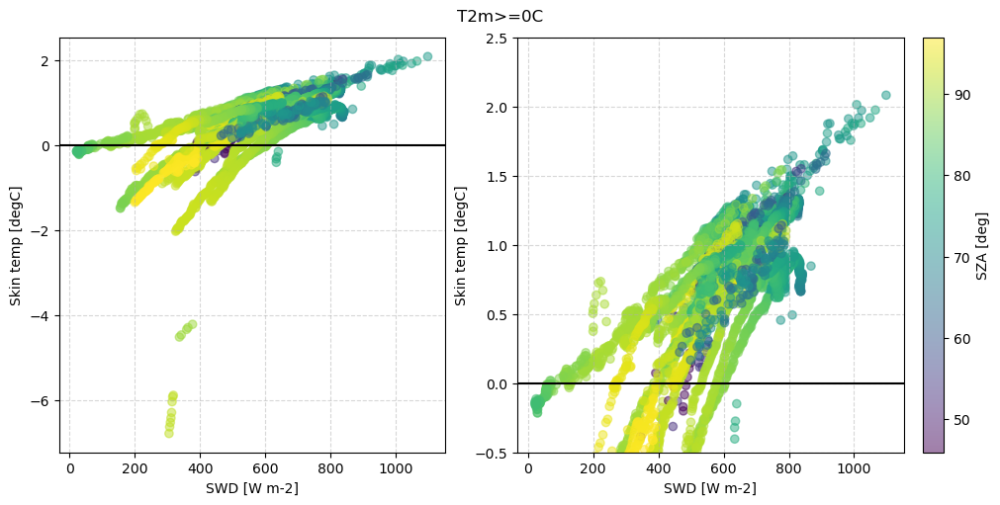

In [127]:
T2m_idx = np.where(asfs_data_lev1['vaisala_T_Avg']>=0)[0]
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][T2m_idx], alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['zenith_true'][T2m_idx], mask=asfs_data_lev1['diffuse_frac'][T2m_idx].mask))
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')

plt.colorbar(cb, label='SZA [deg]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m>=0C')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_SZAcbar_warmT2m.png')

plt.show()

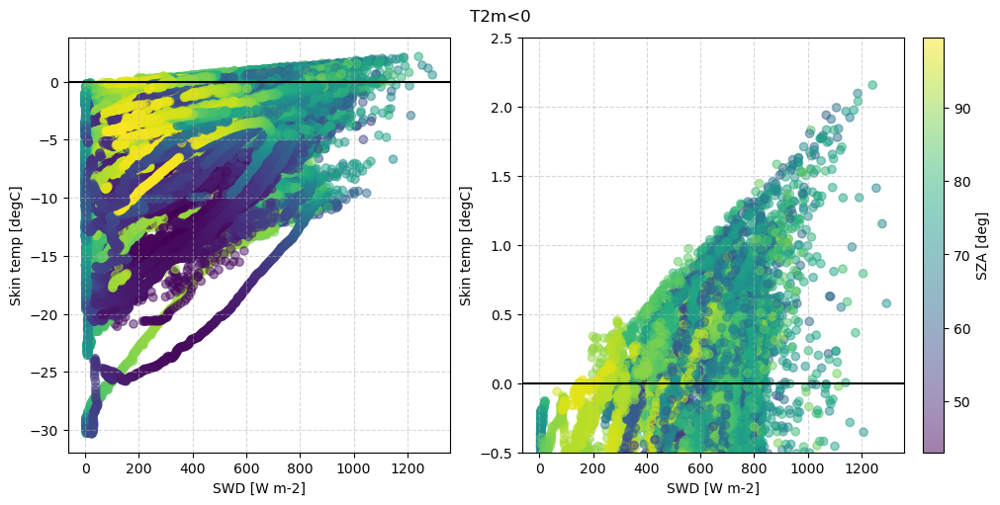

In [128]:
cooler_idx = np.where(asfs_data_lev1['vaisala_T_Avg']<0)[0]

fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][cooler_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][cooler_idx], alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['zenith_true'], mask=asfs_data_lev1['diffuse_frac'].mask)[cooler_idx])
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='SZA [deg]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m<0')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_SZAcbar_coolT2m.png')

plt.show()

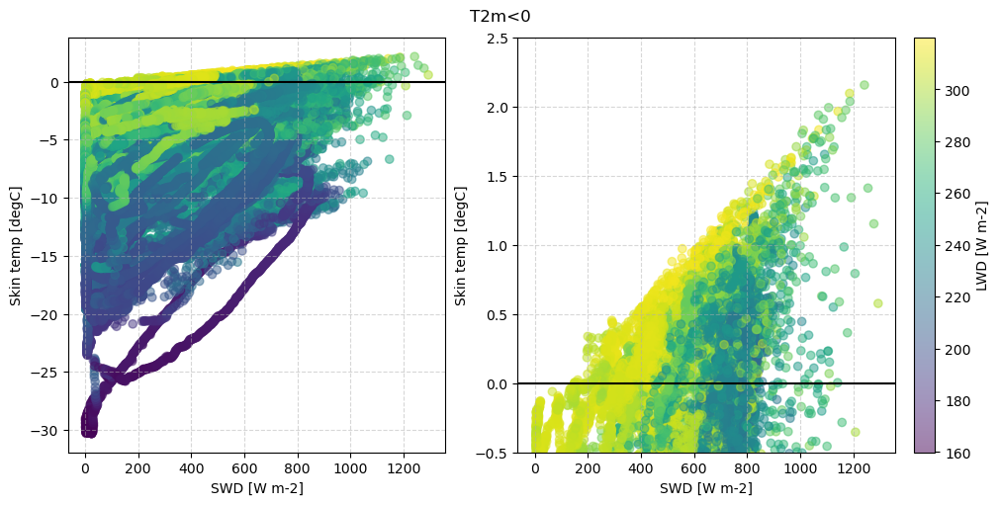

In [45]:
cooler_idx = np.where(asfs_data_lev1['vaisala_T_Avg']<0)[0]

fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][cooler_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][cooler_idx], alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['ir20_lwd_Wm2_Avg'], mask=asfs_data_lev1['diffuse_frac'].mask)[cooler_idx])
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='LWD [W m-2]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m<0')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_SZAcbar_coolT2m.png')

plt.show()

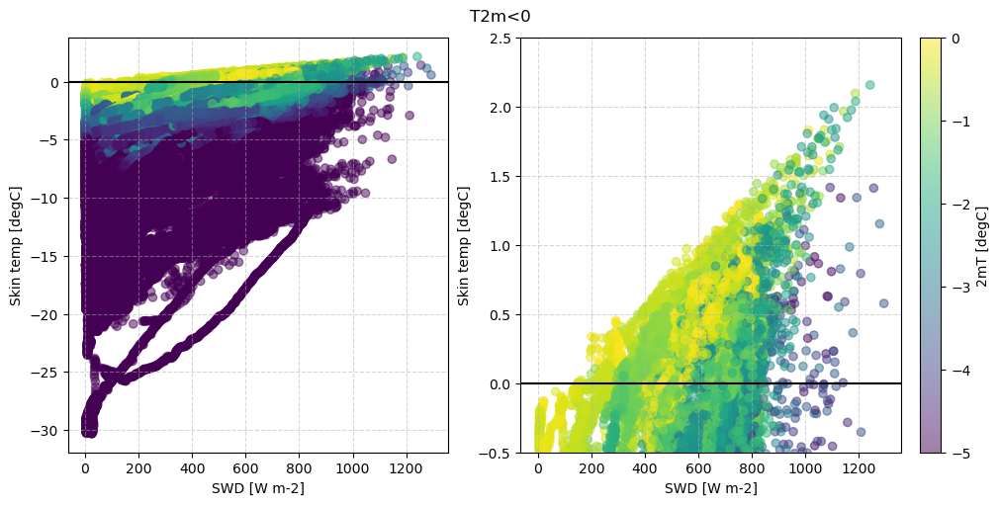

In [129]:
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][cooler_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][cooler_idx], alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['vaisala_T_Avg'], mask=asfs_data_lev1['diffuse_frac'].mask)[cooler_idx],
                    vmin=-5, vmax=0)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='2mT [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m<0')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_coolT2m.png')

plt.show()

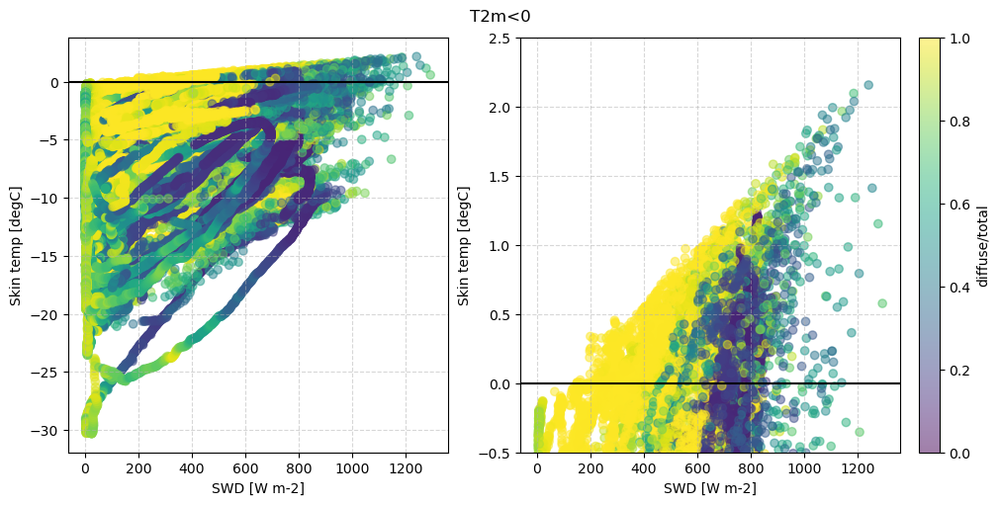

In [130]:
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][cooler_idx], 0,2000), 
                    asfs_data_lev1['skin_temp_surface'][cooler_idx], alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['diffuse_frac'], mask=asfs_data_lev1['diffuse_frac'].mask)[cooler_idx],)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='diffuse/total', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('T2m<0')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_difraccbar_coolT2m.png')

plt.show()

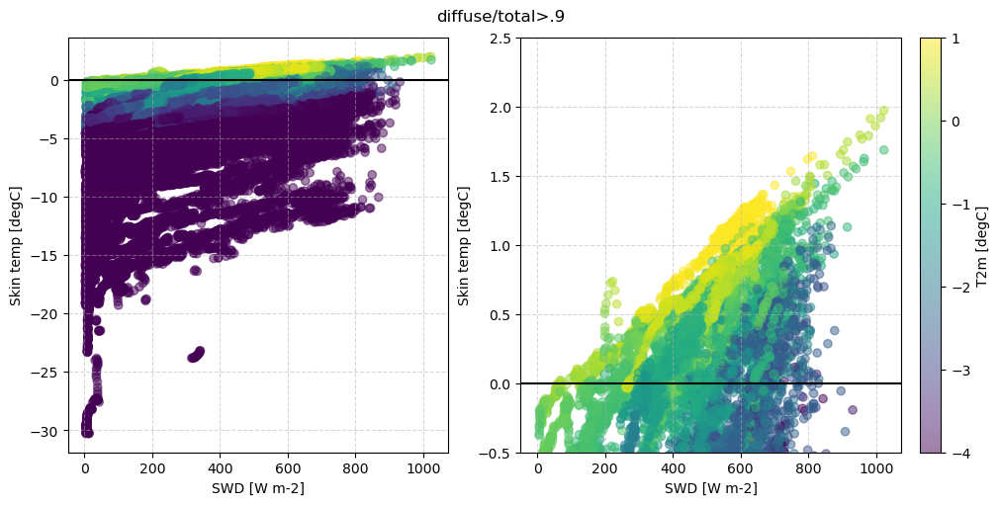

In [131]:
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'], 0,2000), 
                    np.ma.masked_where(asfs_data_lev1['diffuse_frac']<.9, asfs_data_lev1['skin_temp_surface']), alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['vaisala_T_Avg'], mask=asfs_data_lev1['diffuse_frac'].mask),
                   vmin=-4, vmax=1)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='T2m [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('diffuse/total>.9')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_diffuse.png')

plt.show()

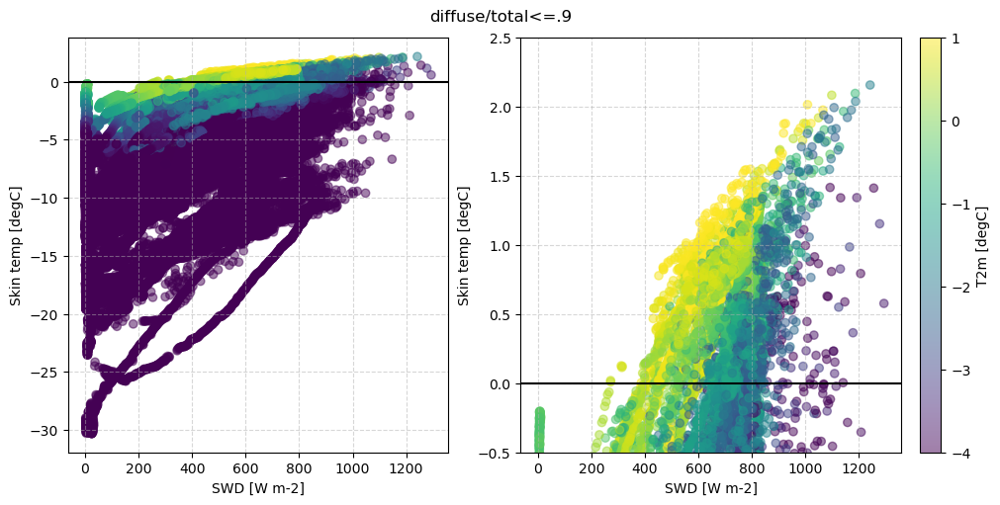

In [132]:
fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)

for ax in axs.ravel():
    cb = ax.scatter(np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'], 0,2000), 
                    np.ma.masked_where(asfs_data_lev1['diffuse_frac']>=.9, asfs_data_lev1['skin_temp_surface']), alpha=.5, 
                    c=np.ma.masked_array(asfs_data_lev1['vaisala_T_Avg'], mask=asfs_data_lev1['diffuse_frac'].mask),
                   vmin=-4, vmax=1)
    ax.set_xlabel('SWD [W m-2]')
    ax.set_ylabel('Skin temp [degC]')
    ax.grid(alpha=.5, ls='--')
    ax.axhline(y=0, c='k')
plt.colorbar(cb, label='T2m [degC]', ax=axs[1])

axs[1].set_ylim(-0.5,2.5)

# plt.legend(loc='best')

fig.suptitle('diffuse/total<=.9')
plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SWD-skinT_T2mcbar_less-diffuse.png')

plt.show()

### MLR for skin temp bias, SWD, and diffuse/total fraction

In [46]:
import statsmodels.api as sm
def reg_m(y, x):
    """ from https://stackoverflow.com/questions/11479064/multiple-linear-regression-in-python"""
    
    ones = np.ones(len(x[0]))
    X = sm.add_constant(np.column_stack((x[0], ones)))
    for ele in x[1:]:
        X = sm.add_constant(np.column_stack((ele, X)))
    results = sm.OLS(y, X).fit()
    return results

In [41]:
# y = [1,2,3,4,3,4,5,4,5,5,4,5,4,5,4,5,6,5,4,5,4,3,4]

# x = [
#      [4,2,3,4,5,4,5,6,7,4,8,9,8,8,6,6,5,5,5,5,5,5,5],
#      [4,1,2,3,4,5,6,7,5,8,7,8,7,8,7,8,7,7,7,7,7,6,5],
#      [4,1,2,5,6,7,8,9,7,8,7,8,7,7,7,7,7,7,6,6,4,4,4]
#      ]

y = asfs_data_lev1['skin_temp_surface'][T2m_idx]
y = np.ma.masked_less(y, 0)

xs = [np.ma.masked_outside(asfs_data_lev1['sr30_swd_IrrC_Avg'][T2m_idx], 0,2000),
     np.ma.masked_array(asfs_data_lev1['vaisala_T_Avg'][T2m_idx], mask=asfs_data_lev1['diffuse_frac'][T2m_idx].mask)]

reg_swd_diff = reg_m(y, xs)
print(reg_swd_diff.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.067
Model:                            OLS   Adj. R-squared:                  0.067
Method:                 Least Squares   F-statistic:                     196.4
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           4.20e-83
Time:                        10:47:43   Log-Likelihood:                -8253.7
No. Observations:                5454   AIC:                         1.651e+04
Df Residuals:                    5451   BIC:                         1.653e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.4909      0.031     15.879      0.0

## also compare top thermistor to 2m temp and SWD

In [23]:
# load SIMBA data
simba_filepath = '/psd3data/arctic/raven/simba/level1/'

lev1_files = glob.glob(simba_filepath+'*.nc')
lev1_files.sort()

## get rid of march files, will also probably want to get rid of first few days of actual data after install as well?
lev1_files = lev1_files[5:]
print(lev1_files[0])

varnames = ['temperature','height','time']

season_data = {}

for fname in lev1_files[:]:
    fdic = load_netcdf(fname, varnames)

    fstart_time = datetime.datetime.strptime(fdic['time_unit'][-19:], '%Y-%m-%d %H:%M:%S')
    fdic['dates'] = np.asarray([fstart_time+datetime.timedelta(minutes=int(m)) for m in fdic['time']])

    for var in ['temperature','dates']:
        if var not in season_data:
            season_data[var] = fdic[var]
        else:
            season_data[var] = np.ma.concatenate( (season_data[var], fdic[var]), axis=0 )

    ## only want one height:
    if 'height' not in season_data:
        season_data['height'] = fdic['height']
    print(season_data['dates'].shape, season_data['height'].shape, season_data['temperature'].shape)

/psd3data/arctic/raven/simba/level1/firnprofile.sled.level1.15min.20240513.000000.nc
(96,) (241,) (96, 241)
(192,) (241,) (192, 241)
(288,) (241,) (288, 241)
(384,) (241,) (384, 241)
(480,) (241,) (480, 241)
(576,) (241,) (576, 241)
(672,) (241,) (672, 241)
(768,) (241,) (768, 241)
(864,) (241,) (864, 241)
(960,) (241,) (960, 241)
(1056,) (241,) (1056, 241)
(1152,) (241,) (1152, 241)
(1248,) (241,) (1248, 241)
(1344,) (241,) (1344, 241)
(1440,) (241,) (1440, 241)
(1536,) (241,) (1536, 241)
(1632,) (241,) (1632, 241)
(1728,) (241,) (1728, 241)
(1824,) (241,) (1824, 241)
(1920,) (241,) (1920, 241)
(2016,) (241,) (2016, 241)
(2112,) (241,) (2112, 241)
(2208,) (241,) (2208, 241)
(2304,) (241,) (2304, 241)
(2400,) (241,) (2400, 241)
(2496,) (241,) (2496, 241)
(2592,) (241,) (2592, 241)
(2688,) (241,) (2688, 241)
(2784,) (241,) (2784, 241)
(2880,) (241,) (2880, 241)
(2976,) (241,) (2976, 241)
(3072,) (241,) (3072, 241)
(3168,) (241,) (3168, 241)
(3264,) (241,) (3264, 241)
(3360,) (241,) (336

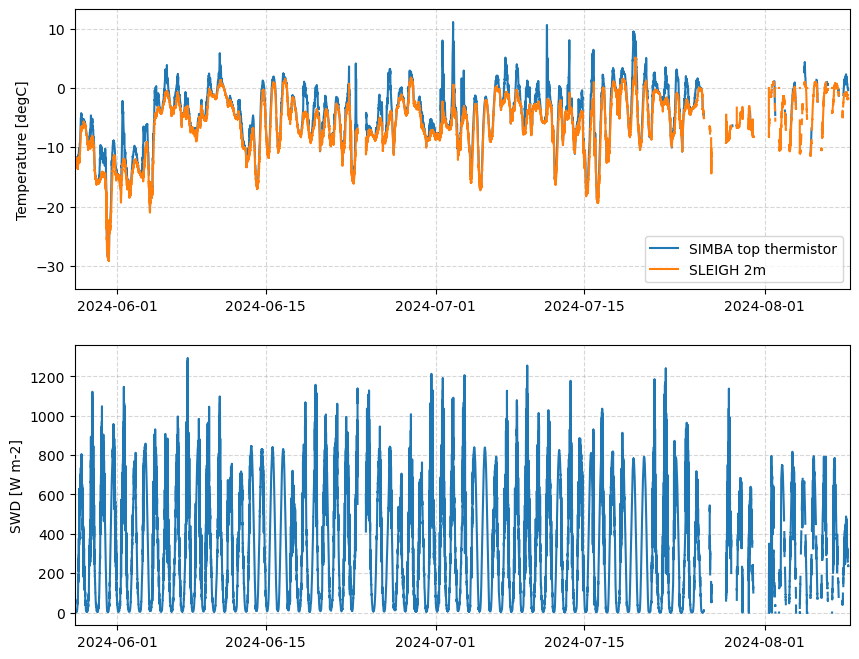

In [24]:
fig, axs = plt.subplots(2, figsize=(10,8))
axs[0].plot(season_data['dates'], season_data['temperature'][:,0], label='SIMBA top thermistor')
axs[0].plot(asfs_data_lev1['dates'], asfs_data_lev1['vaisala_T_Avg'], label='SLEIGH 2m')
axs[0].legend(loc='best')

axs[1].plot(asfs_data_lev1['dates'], asfs_data_lev1['sr30_swd_IrrC_Avg'])

for ax in axs.ravel():
    ax.grid(alpha=.5, ls='--')
    ax.set_xlim(datetime.datetime(2024,5,28,0),datetime.datetime(2024,8,9,))
axs[0].set_ylabel('Temperature [degC]')
axs[1].set_ylabel('SWD [W m-2]')
# axs[1].set_xlabel('Day HH:MM since June 1, 2024')
plt.show()

### steps for creating a bias correction between SIMBA and Viasala 2mT:

get SLEIGH time steps closest to SIMBA 15 minute step

difference SLEIGH and SIMBA 2m temps

regressions beween difference and relevant variables: SWD, SWD/albedo, diffuse, direct, diffuse fraction, T2m

In [71]:
def nearest(items, pivot):
    return min(items, key=lambda x: abs(x - pivot))

In [25]:
common_dates, sleigh_ind, simba_ind = np.intersect1d(asfs_data_lev1['dates'],season_data['dates'], return_indices=True)

print(common_dates )

[datetime.datetime(2024, 5, 28, 0, 0)
 datetime.datetime(2024, 5, 28, 0, 15)
 datetime.datetime(2024, 5, 28, 0, 30) ...
 datetime.datetime(2024, 8, 14, 23, 15)
 datetime.datetime(2024, 8, 14, 23, 30)
 datetime.datetime(2024, 8, 14, 23, 45)]


In [26]:
diff_T2m = season_data['temperature'][:,0][simba_ind] - asfs_data_lev1['vaisala_T_Avg'][sleigh_ind]
diff_T2m = np.ma.masked_array(diff_T2m, mask=asfs_data_lev1['vaisala_T_Avg'][sleigh_ind].mask)

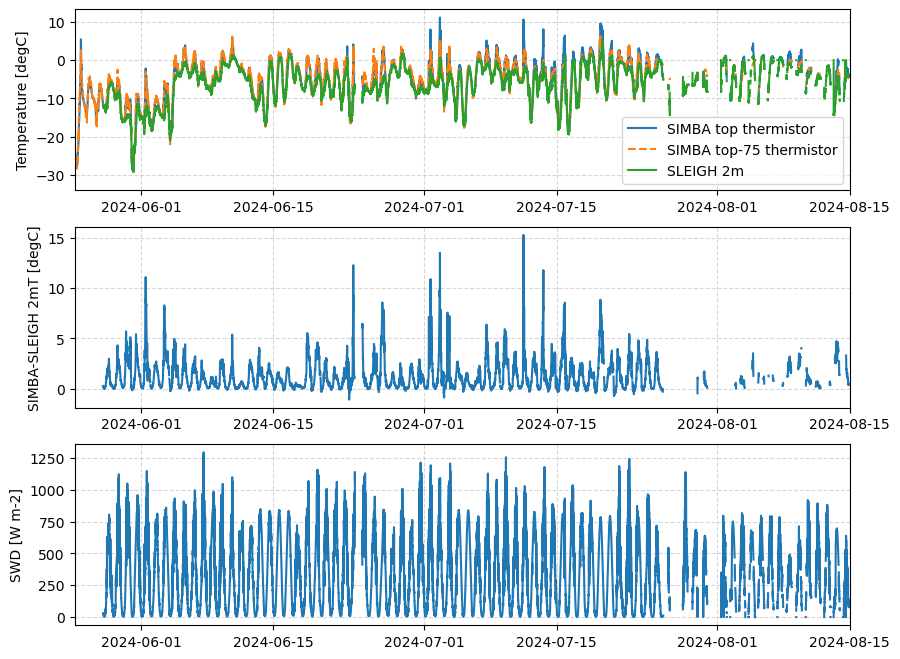

In [45]:
fig, axs = plt.subplots(3, figsize=(10,8))
axs[0].plot(season_data['dates'], season_data['temperature'][:,0], label='SIMBA top thermistor', )
axs[0].plot(season_data['dates'], season_data['temperature'][:,75], label='SIMBA top-75 thermistor', ls='--')

axs[0].plot(asfs_data_lev1['dates'], asfs_data_lev1['vaisala_T_Avg'], label='SLEIGH 2m', )
axs[0].legend(loc='best')
# axs[0].set_ylim(-15,-10)

axs[1].plot(common_dates, diff_T2m)

axs[2].plot(asfs_data_lev1['dates'], asfs_data_lev1['sr30_swd_IrrC_Avg'])

for ax in axs.ravel():
    ax.grid(alpha=.5, ls='--')
    ax.set_xlim(datetime.datetime(2024,5,25),datetime.datetime(2024,8,15))
axs[0].set_ylabel('Temperature [degC]')
axs[1].set_ylabel('SIMBA-SLEIGH 2mT [degC]')
axs[2].set_ylabel('SWD [W m-2]')
# axs[1].set_xlabel('Day HH:MM since June 1, 2024')
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SELIGH_SIMBA_T2m-bias.png')

plt.show()

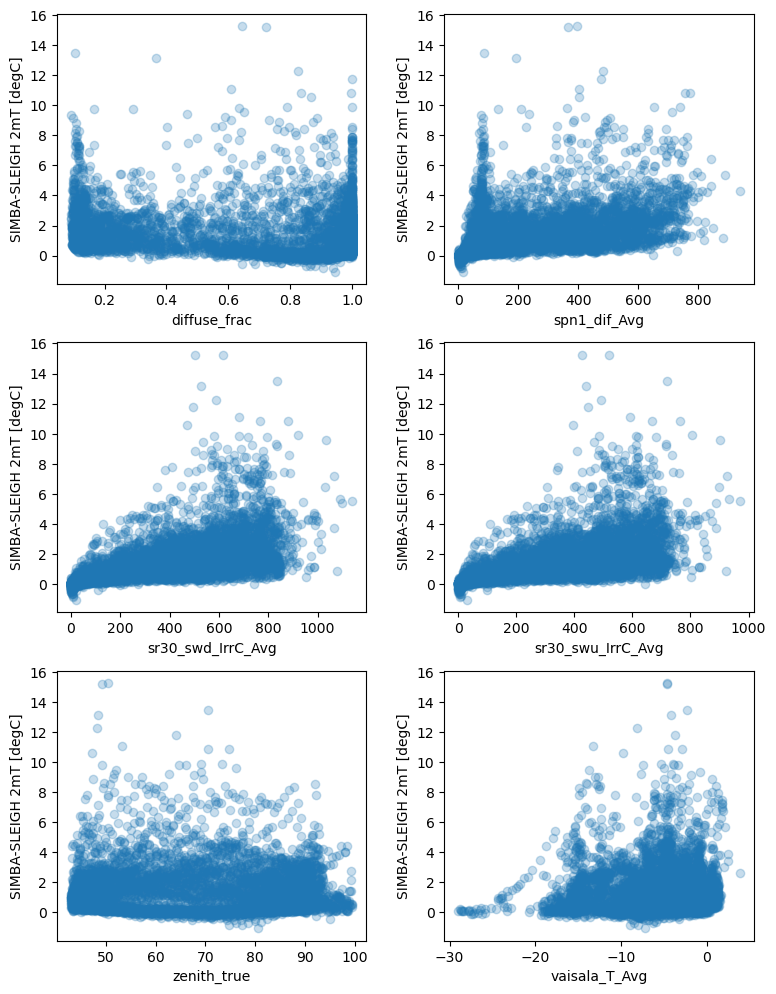

In [28]:
input_vars = ['diffuse_frac', 'spn1_dif_Avg','sr30_swd_IrrC_Avg', 'sr30_swu_IrrC_Avg', 'zenith_true','vaisala_T_Avg']
fig, axs = plt.subplots(3,2, figsize=(8,10))

for ax, var in zip(axs.ravel(), input_vars):
    ax.scatter(asfs_data_lev1[var][sleigh_ind], diff_T2m, alpha=.25)
    ax.set_ylabel('SIMBA-SLEIGH 2mT [degC]')
    ax.set_xlabel(var)

plt.tight_layout()
# plt.savefig('/home/asledd/ICECAPS/temp_bias_figures/Raven_2024_SELIGH_SIMBA_T2m-bias_regressions.png')

plt.show()

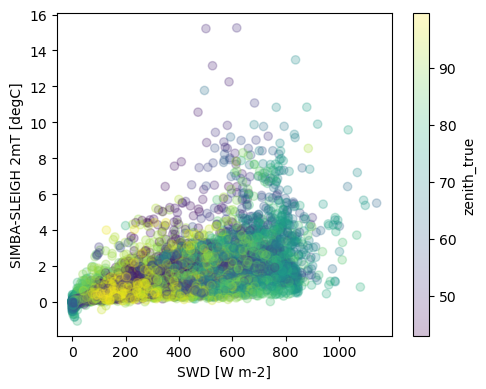

In [140]:
input_vars = ['diffuse_frac', 'spn1_dif_Avg','sr30_swd_IrrC_Avg', 'sr30_swu_IrrC_Avg', 'zenith_true','vaisala_T_Avg']
fig, ax = plt.subplots(1, figsize=(5,4))

cvar = 'zenith_true'
cb = ax.scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], diff_T2m, alpha=.25, c=asfs_data_lev1[cvar][sleigh_ind])#, vmin=.7, vmax=1)
plt.colorbar(cb, label=cvar)
ax.set_ylabel('SIMBA-SLEIGH 2mT [degC]')
ax.set_xlabel('SWD [W m-2]')

plt.tight_layout()
plt.show()

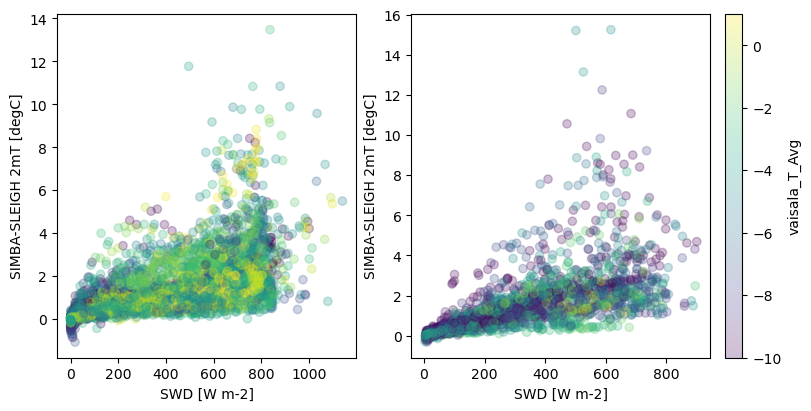

In [142]:
input_vars = ['diffuse_frac', 'spn1_dif_Avg','sr30_swd_IrrC_Avg', 'sr30_swu_IrrC_Avg', 'zenith_true','vaisala_T_Avg']
fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True)

cvar = 'vaisala_T_Avg'
zenith = asfs_data_lev1['zenith_true'][sleigh_ind]

masked_yvars = [np.ma.masked_where(zenith<60, diff_T2m), np.ma.masked_where(zenith>=60, diff_T2m)]

for ax, yvar in zip(axs.ravel(), masked_yvars):
    cb = ax.scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], yvar, alpha=.25, c=asfs_data_lev1[cvar][sleigh_ind], vmin=-10, vmax=1)
    ax.set_ylabel('SIMBA-SLEIGH 2mT [degC]')
    ax.set_xlabel('SWD [W m-2]')
plt.colorbar(cb, label=cvar)

# plt.tight_layout()
plt.show()

In [99]:
## multivariate linear regrssion

y = diff_T2m

xs = [asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], asfs_data_lev1['vaisala_T_Avg'][sleigh_ind],
     asfs_data_lev1['diffuse_frac'][sleigh_ind]]

reg_T2m_diff = reg_m(y, xs)
print(reg_T2m_diff.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     3265.
Date:                Thu, 07 Nov 2024   Prob (F-statistic):               0.00
Time:                        16:18:57   Log-Likelihood:                -68493.
No. Observations:                7392   AIC:                         1.370e+05
Df Residuals:                    7388   BIC:                         1.370e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.6571      0.040     16.586      0.0

In [40]:
print(reg_T2m_diff.params)

[ 6.57110607e-01  1.98535617e-01  8.04707504e-04 -6.87280535e+02]


In [ ]:
# new_ys = reg_T2m_diff.predict(new_x)

### load PROMICE wind speeds to see if they impact temperature bias

In [21]:
promice_vars = ['time', 'wspd_l', 'wspd_u', ]
promice_dic = load_netcdf('/home/asledd/ICECAPS/DY2_10min_comp.nc', promice_vars)
# time = 'minutes since 2022-06-16 15:30:00'
# wspd_i = instantaneous wind speed
# wspd_u = wind speed upper boom
# wspd_l = wind speed lower boom
## guessing the wind speeds from booms are averages?

In [22]:
promice_dic['dates'] = np.asarray([datetime.datetime(2022,6,16,15,30)+datetime.timedelta(minutes=int(dt)) for dt in promice_dic['time']])

In [23]:
## houlry promice
# time = hours since 1996-05-24 20:00:00"
promice_hr_dic = load_netcdf('/home/asledd/ICECAPS/DY2_Complete_PROMICE_Dataset_hourly.nc', promice_vars)
promice_hr_dic['dates'] = np.asarray([datetime.datetime(1996,5,24,20,0)+datetime.timedelta(hours=int(dt)) for dt in promice_hr_dic['time']])

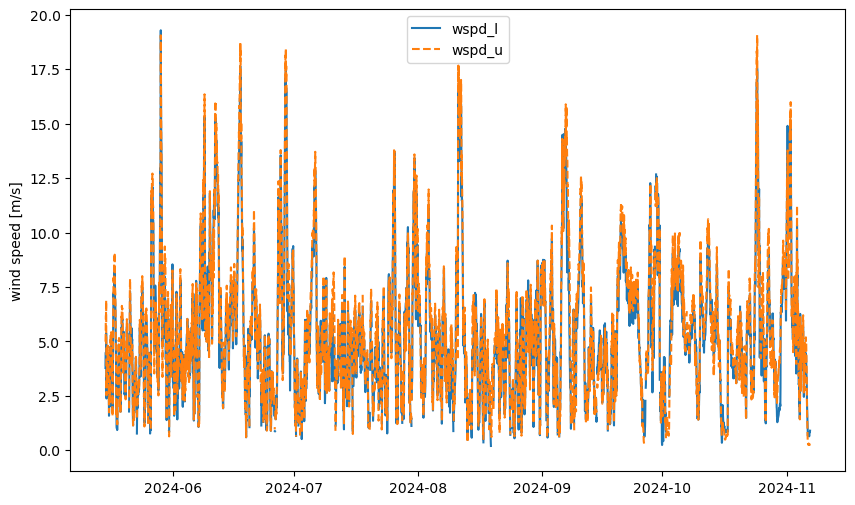

In [24]:
raven_idx = np.where(promice_hr_dic['dates']>datetime.datetime(2024,5,15))
fig, ax = plt.subplots(1, figsize=(10,6))
for var, ls in zip(['wspd_l', 'wspd_u'],['-','--',':']):
    plt.plot(promice_hr_dic['dates'][raven_idx], promice_hr_dic[var][raven_idx], label=var, ls=ls)

plt.legend(loc='best')
plt.ylabel('wind speed [m/s]')
# plt.xlabel('minutes since 2022-06-16 15:30:00')
plt.show()

In [25]:
## need to interpolate hourly to 15 minute? IDK if that's ideal...but maybe good enough
from scipy.interpolate import interp1d


In [26]:
def dt_to_seconds(dt):

    secs = np.array([(t-datetime.datetime(1970,1,1)).total_seconds() for \
                            _,t in np.ndenumerate(dt)])
    return secs

In [27]:
f = interp1d(dt_to_seconds(promice_hr_dic['dates'][raven_idx]), promice_hr_dic['wspd_l'][raven_idx])
## need to get same 'hours since date' for raven? or turn promice into same timestep as simba....
wspd_15m = f(dt_to_seconds(season_data['dates'][simba_ind]) )

NameError: name 'season_data' is not defined

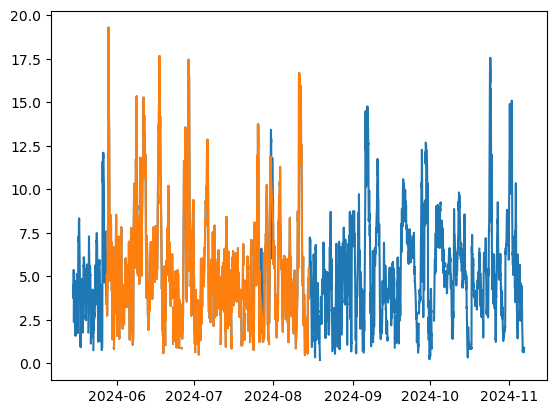

In [87]:
plt.plot(promice_hr_dic['dates'][raven_idx], promice_hr_dic['wspd_l'][raven_idx])
plt.plot(season_data['dates'][simba_ind], wspd_15m)
plt.show()

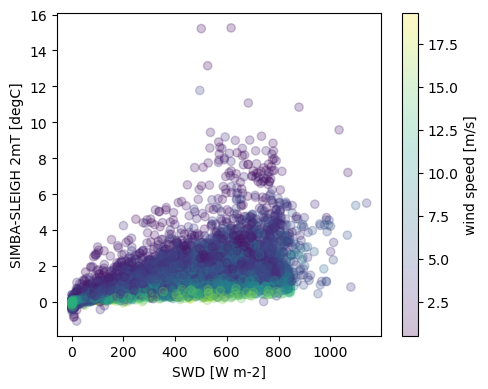

In [88]:
fig, ax = plt.subplots(1, figsize=(5,4))

cb = ax.scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], diff_T2m, alpha=.25, c=wspd_15m)#, vmin=.7, vmax=1)
plt.colorbar(cb, label='wind speed [m/s]')
ax.set_ylabel('SIMBA-SLEIGH 2mT [degC]')
ax.set_xlabel('SWD [W m-2]')

plt.tight_layout()
plt.show()

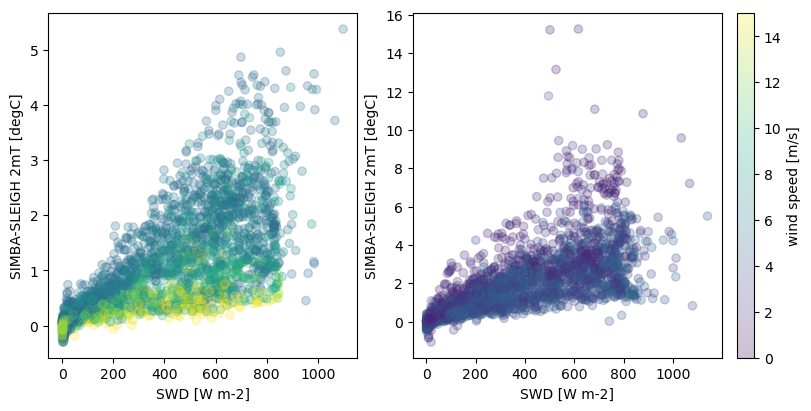

In [102]:
input_vars = ['diffuse_frac', 'spn1_dif_Avg','sr30_swd_IrrC_Avg', 'sr30_swu_IrrC_Avg', 'zenith_true','vaisala_T_Avg']
fig, axs = plt.subplots(1,2, figsize=(8,4), constrained_layout=True)

cvar = wspd_15m

masked_yvars = [np.ma.masked_where(cvar<5, diff_T2m), np.ma.masked_where(cvar>=5, diff_T2m)]

for ax, yvar in zip(axs.ravel(), masked_yvars):
    cb = ax.scatter(asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], yvar, alpha=.25, c=cvar, vmin=0, vmax=15)
    ax.set_ylabel('SIMBA-SLEIGH 2mT [degC]')
    ax.set_xlabel('SWD [W m-2]')
plt.colorbar(cb, label='wind speed [m/s]')

# plt.tight_layout()
plt.show()

In [96]:
wspd_15m = np.ma.masked_invalid(wspd_15m)

In [97]:
## multivariate linear regrssion

y = diff_T2m[~wspd_15m.mask]

xs = [asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], asfs_data_lev1['vaisala_T_Avg'][sleigh_ind],
     asfs_data_lev1['diffuse_frac'][sleigh_ind], wspd_15m]
xs = [xv[~wspd_15m.mask] for xv in xs]
for xv in xs:
    print(xv.shape)


reg_T2m_diff = reg_m(y, xs)
print(reg_T2m_diff.summary())


(7177,)
(7177,)
(7177,)
(7177,)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     2344.
Date:                Thu, 07 Nov 2024   Prob (F-statistic):               0.00
Time:                        16:14:34   Log-Likelihood:                -66545.
No. Observations:                7177   AIC:                         1.331e+05
Df Residuals:                    7172   BIC:                         1.331e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            41.622

In [98]:
## multivariate linear regrssion

y = diff_T2m#[~wspd_15m.mask]

xs = [asfs_data_lev1['sr30_swd_IrrC_Avg'][sleigh_ind], asfs_data_lev1['vaisala_T_Avg'][sleigh_ind],
     asfs_data_lev1['diffuse_frac'][sleigh_ind]]
# xs = [xv[~wspd_15m.mask] for xv in xs]
for xv in xs:
    print(xv.shape)


reg_T2m_diff = reg_m(y, xs)
print(reg_T2m_diff.summary())


(7392,)
(7392,)
(7392,)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     3265.
Date:                Thu, 07 Nov 2024   Prob (F-statistic):               0.00
Time:                        16:15:13   Log-Likelihood:                -68493.
No. Observations:                7392   AIC:                         1.370e+05
Df Residuals:                    7388   BIC:                         1.370e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.6571      0